# Credit Risk Assessment Using Machine Learning

### Importing Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import plotly.express as px
import warnings
warnings.simplefilter(action='ignore')
import os
sb.set()

### Loading Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv("/content/drive/MyDrive/World bank/Data_Correct_Null.csv")
df.head()

,economy,economycode,regionwb,pop_adult,wpid_random,wgt,female,age,educ,inc_q,...,receive_wages,receive_transfers,receive_pension,receive_agriculture,pay_utilities,remittances,mobileowner,internetaccess,anydigpayment,merchantpay_dig
0,Afghanistan,AFG,South Asia,22647496.0,140343632,0.774286,1,19.0,2,4,...,4,4,4,4.0,4,5.0,1,2,0,0.0
1,Afghanistan,AFG,South Asia,22647496.0,167823412,0.766367,1,40.0,1,5,...,4,4,4,4.0,4,5.0,1,2,0,0.0
2,Afghanistan,AFG,South Asia,22647496.0,182483450,0.588983,1,25.0,1,1,...,4,4,4,4.0,4,5.0,1,2,0,0.0
3,Afghanistan,AFG,South Asia,22647496.0,170778240,2.572345,1,40.0,1,4,...,4,4,4,4.0,4,5.0,2,2,0,0.0
4,Afghanistan,AFG,South Asia,22647496.0,170712642,0.525471,2,27.0,3,1,...,1,4,4,4.0,4,5.0,1,1,1,0.0


### Checking for Null Values, Counts and Data Types

In [ ]:
df.isnull().sum()

economy            0
economycode        0
regionwb           0
pop_adult          0
wpid_random        0
                  ..
remittances        0
mobileowner        0
internetaccess     0
anydigpayment      0
merchantpay_dig    0
Length: 127, dtype: int64

In [ ]:
data = df.drop(['fin14_2_China', 'fin14c_2_China', 'fin31b1_China', 'fin45_1_China'], axis = 1)

In [ ]:
data.shape

(127854, 123)

In [ ]:
data.dtypes[data.dtypes == 'int64']

wpid_random          int64
female               int64
educ                 int64
inc_q                int64
account              int64
account_fin          int64
fin2                 int64
fin14_1              int64
fin14a               int64
fin14a1              int64
fin14b               int64
fin16                int64
fin17a               int64
fin20                int64
fin22a               int64
fin22b               int64
fin24                int64
fin30                int64
fin32                int64
fin37                int64
fin38                int64
fin44a               int64
fin44b               int64
fin44c               int64
fin44d               int64
saved                int64
borrowed             int64
receive_wages        int64
receive_transfers    int64
receive_pension      int64
pay_utilities        int64
mobileowner          int64
internetaccess       int64
anydigpayment        int64
dtype: object

In [ ]:
data.dtypes[data.dtypes == 'int64'].count()

34

In [ ]:
data.dtypes[data.dtypes == 'float64']

pop_adult              float64
wgt                    float64
age                    float64
emp_in                 float64
urbanicity_f2f         float64
                        ...   
fin45                  float64
fin45_1                float64
receive_agriculture    float64
remittances            float64
merchantpay_dig        float64
Length: 86, dtype: object

In [ ]:
data.dtypes[data.dtypes == 'float64'].count()

86

In [ ]:
data.dtypes[data.dtypes == 'object']

economy        object
economycode    object
regionwb       object
dtype: object

In [ ]:
data.dtypes[data.dtypes == 'object'].count()

3

In [ ]:
print("number of unique values are ",df['economy'].value_counts().count())
country_data = pd.DataFrame(df['economy'].value_counts())
country_data

number of unique values are  123


,economy
China,3500
India,3000
Russian Federation,2011
Indonesia,1062
Lebanon,1022
...,...
Mali,1000
Malaysia,1000
Zimbabwe,1000
Iceland,502


### Exploratory Data Analysis

#### Visualizing similar Features to Check and Compare their Responses

In [ ]:
x = ['Yes', 'No', 'I do not know', 'Refuse to Answer']
df = data.copy()

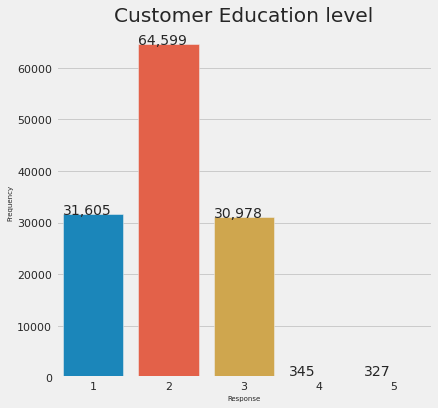

In [ ]:
# visualzing number of customers' education level

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['educ'])
plt.title('Customer Education level', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

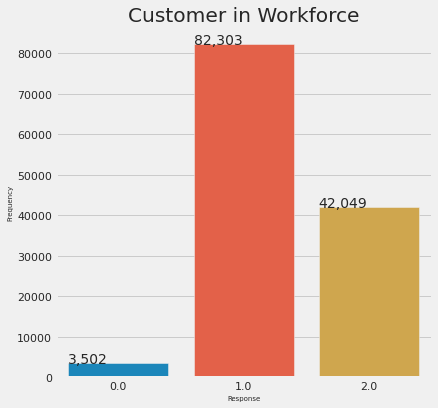

In [ ]:
# visualzing number of customers' in the workforce

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['emp_in'])
plt.title('Customer in Workforce', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

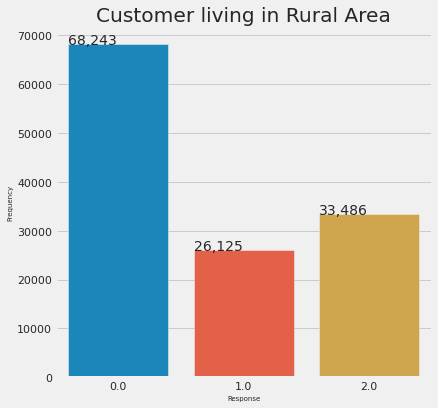

In [ ]:
# visualzing number of customers' living in rural area

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['urbanicity_f2f'])
plt.title('Customer living in Rural Area', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

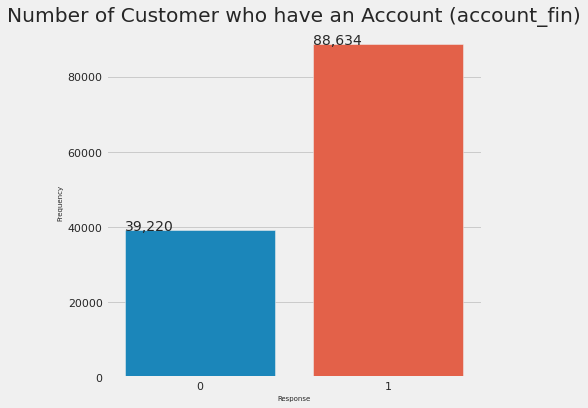

In [ ]:
# visualzing number of customers' who has an account in a financial institution

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['account_fin'])
plt.title('Number of Customer who have an Account (account_fin)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()


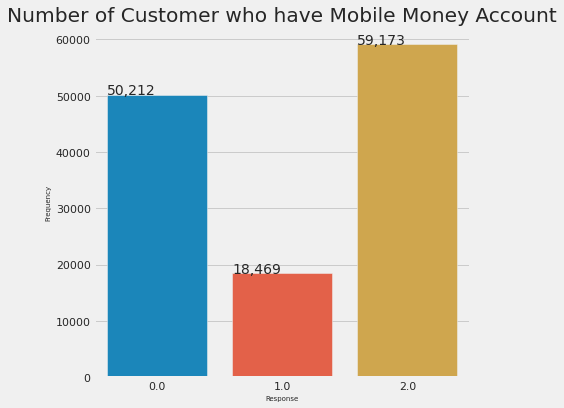

In [ ]:
# visualzing number of customers' who has a mobile money account

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['account_mob'])
plt.title('Number of Customer who have Mobile Money Account', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

"account" is a combination of "account_fin" and "account_mob"

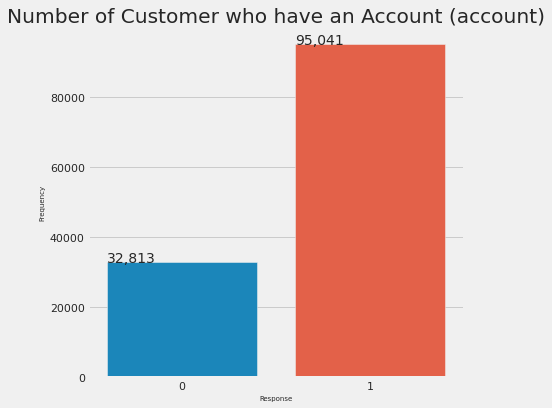

In [ ]:
# visualzing number of customers' who has an account in a financial institution
# this feature is a combination of account_fin and account_mob
plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['account'])
plt.title('Number of Customer who have an Account (account)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

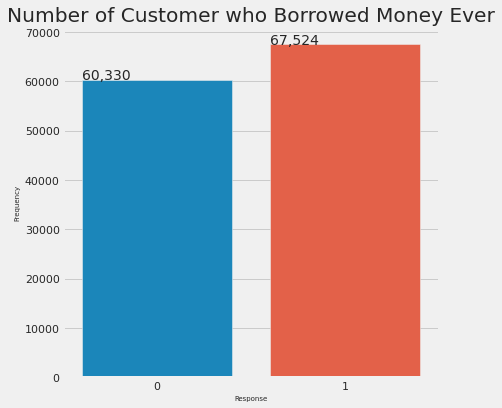

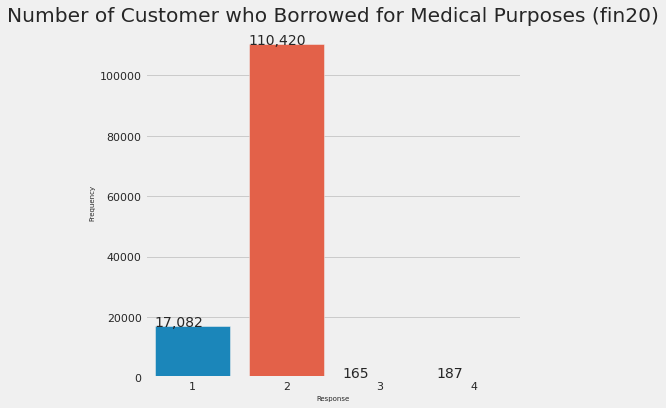

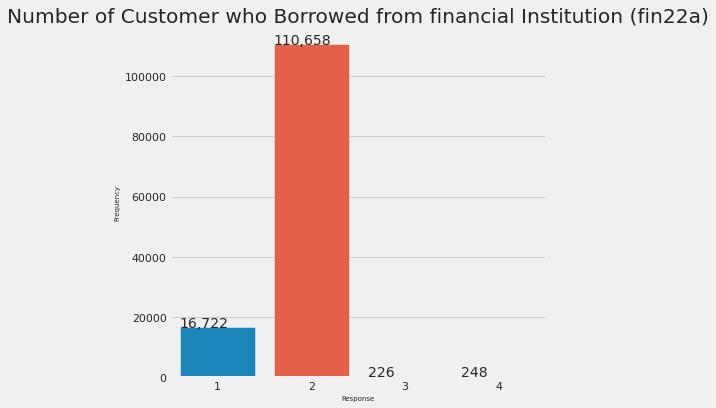

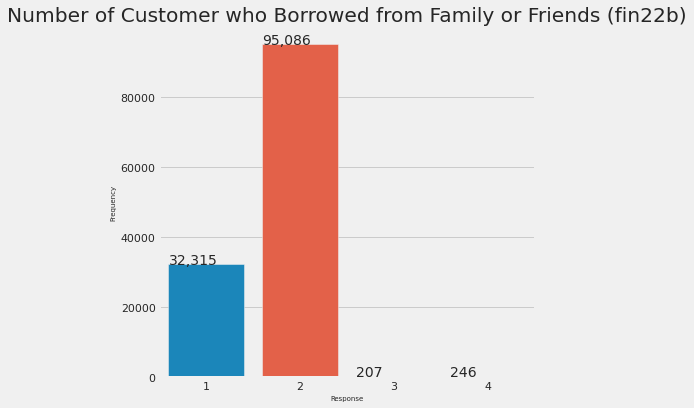

In [ ]:
# visualzing number of customers' who has ever borrowed money from any source
# borrowed

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['borrowed'])
plt.title('Number of Customer who Borrowed Money Ever', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

# visualzing number of customers' who has ever borrowed for medical purposes
# fin20

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin20'])
plt.title('Number of Customer who Borrowed for Medical Purposes (fin20)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

# visualzing number of customers' who has ever borrowed from financial institution
# fin22a

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin22a'])
plt.title('Number of Customer who Borrowed from financial Institution (fin22a)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

# visualzing number of customers' who has ever borrowed from family or friends
# fin22b

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin22b'])
plt.title('Number of Customer who Borrowed from Family or Friends (fin22b)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

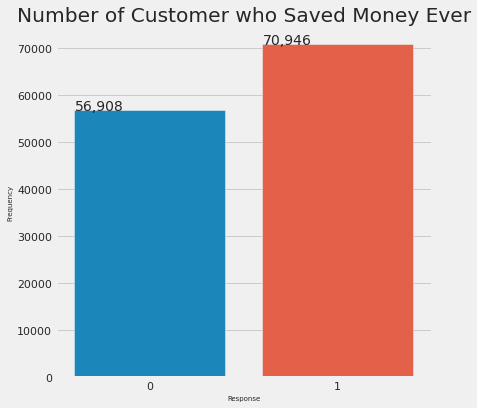

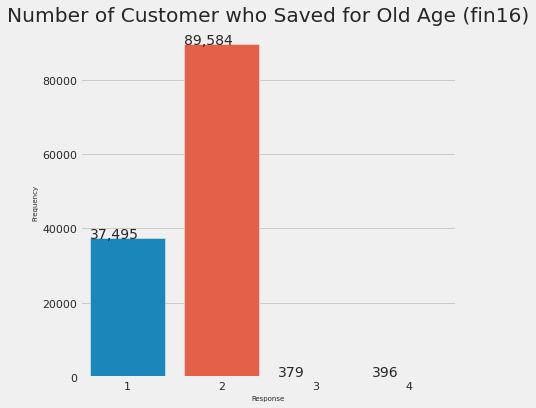

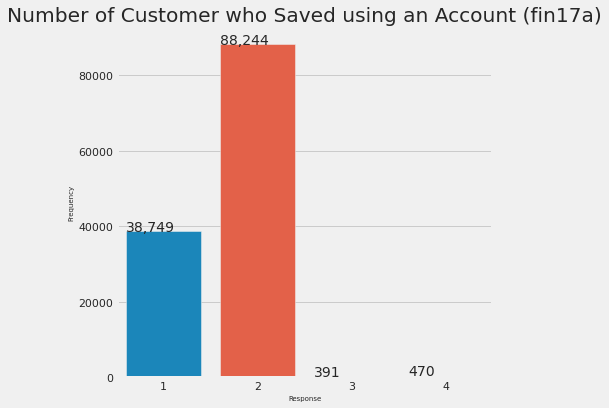

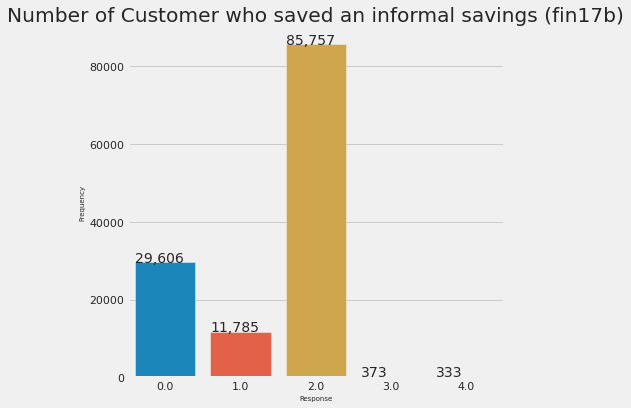

In [ ]:
# visualzing number of customers' who has ever saved money from any source
# saved

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['saved'])
plt.title('Number of Customer who Saved Money Ever', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

# visualzing number of customers' who has ever saved for old age
# fin16

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin16'])
plt.title('Number of Customer who Saved for Old Age (fin16)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

# visualzing number of customers' who has ever saved using an account
# fin17a

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin17a'])
plt.title('Number of Customer who Saved using an Account (fin17a)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

# visualzing number of customers' who has ever saved an informal savings
# fin17b

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin17b'])
plt.title('Number of Customer who saved an informal savings (fin17b)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

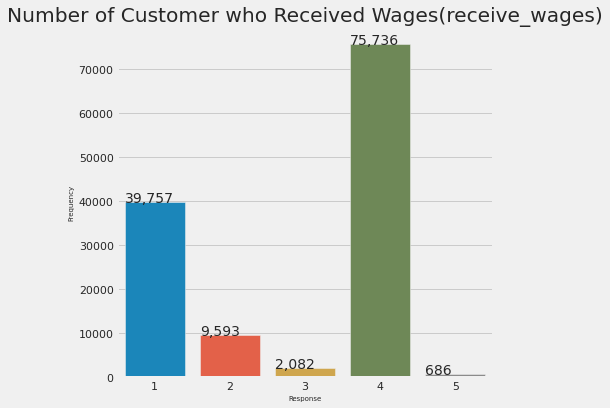

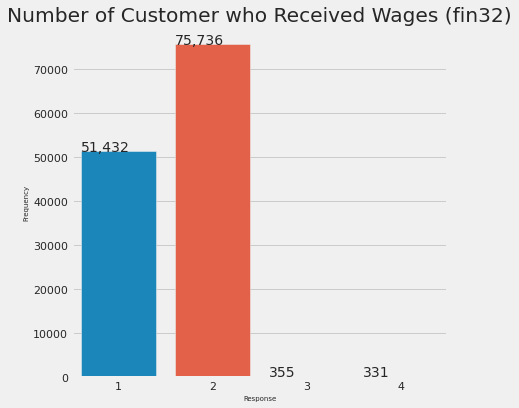

In [ ]:
# visualzing number of customers' who has ever received wages
# receive_wages

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['receive_wages'])
plt.title('Number of Customer who Received Wages(receive_wages)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

# visualzing number of customers' who has ever received wages
# fin32

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin32'])
plt.title('Number of Customer who Received Wages (fin32)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

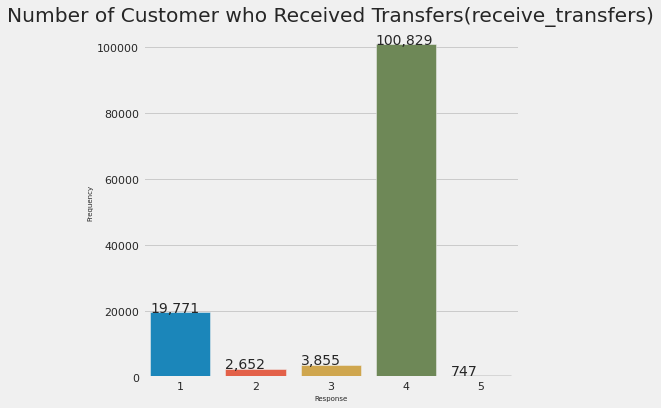

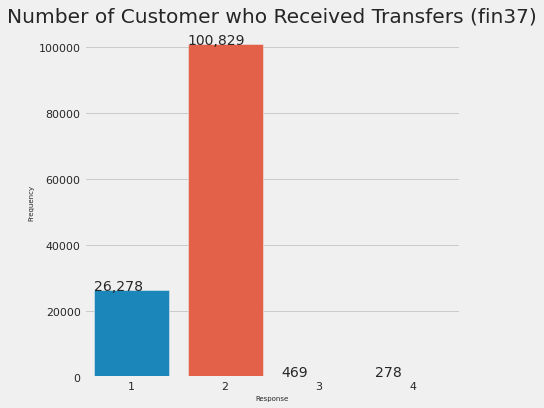

In [ ]:
# visualzing number of customers' who has ever received wages
# receive_transfers

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['receive_transfers'])
plt.title('Number of Customer who Received Transfers(receive_transfers)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

# visualzing number of customers' who has ever received wages
# fin37

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin37'])
plt.title('Number of Customer who Received Transfers (fin37)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

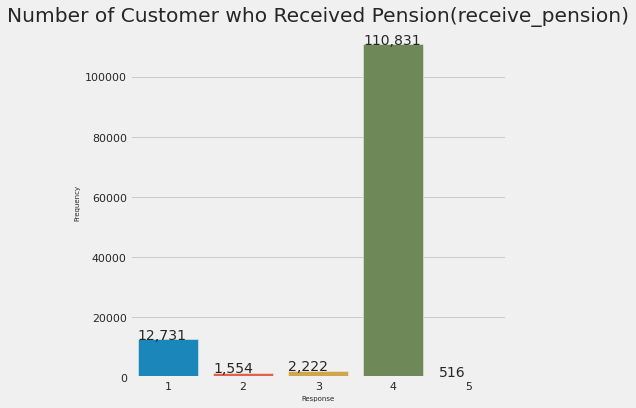

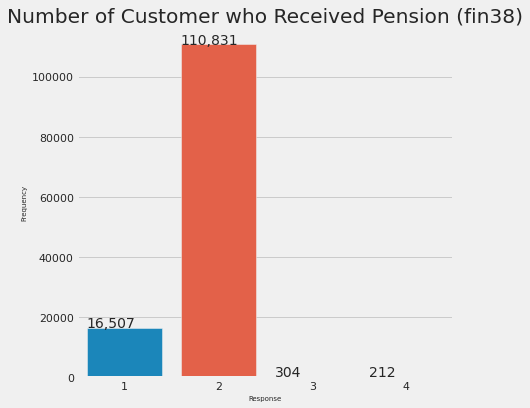

In [ ]:
# visualzing number of customers' who has ever received pension
# receive_pension

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['receive_pension'])
plt.title('Number of Customer who Received Pension(receive_pension)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

# visualzing number of customers' who has ever received pension
# fin38

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin38'])
plt.title('Number of Customer who Received Pension (fin38)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

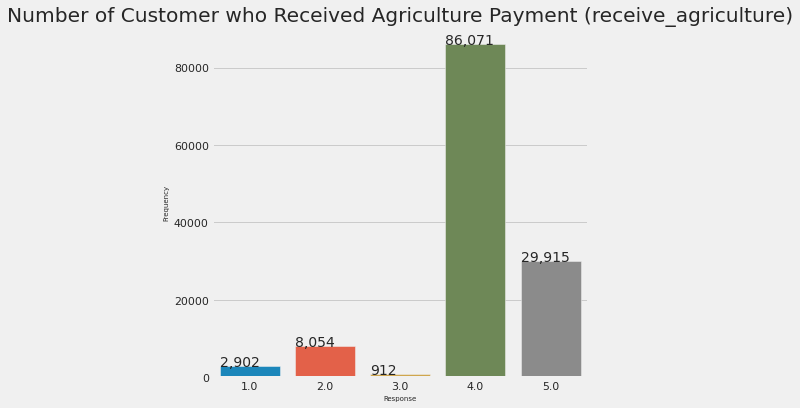

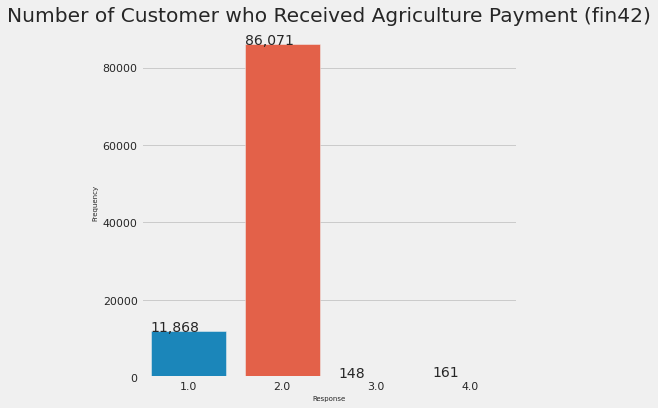

In [ ]:
# visualzing number of customers' who has ever received pension
# receive_agriculture

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['receive_agriculture'])
plt.title('Number of Customer who Received Agriculture Payment (receive_agriculture)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

# visualzing number of customers' who has ever received pension
# fin42

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin42'])
plt.title('Number of Customer who Received Agriculture Payment (fin42)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

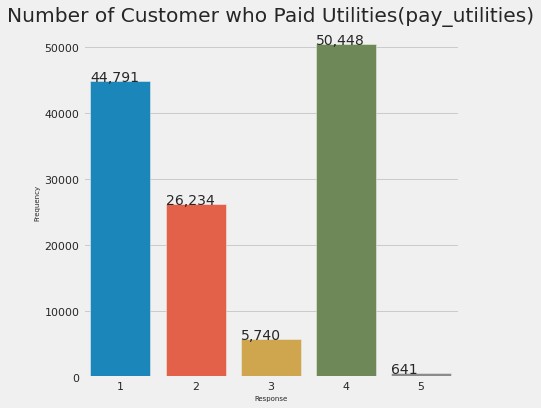

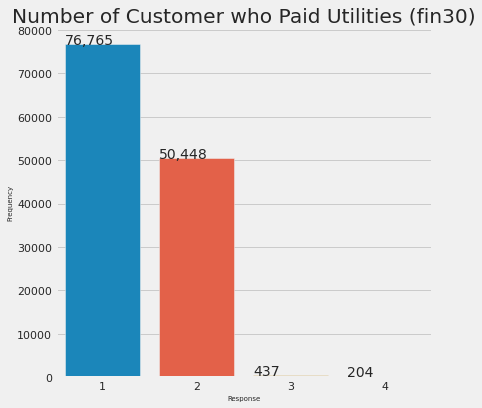

In [ ]:
# visualzing number of customers' who has ever paid utilities
# pay_utilities

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['pay_utilities'])
plt.title('Number of Customer who Paid Utilities(pay_utilities)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

# visualzing number of customers' who has ever paid utilities
# fin30

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin30'])
plt.title('Number of Customer who Paid Utilities (fin30)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

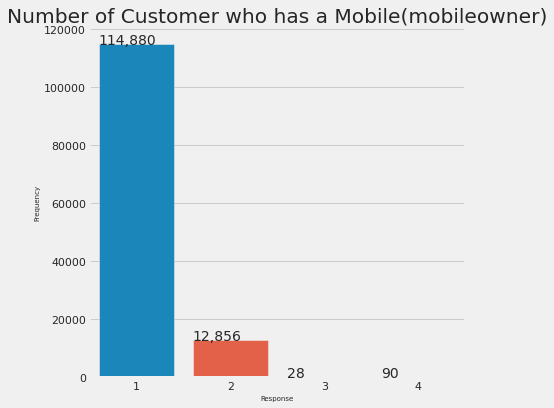

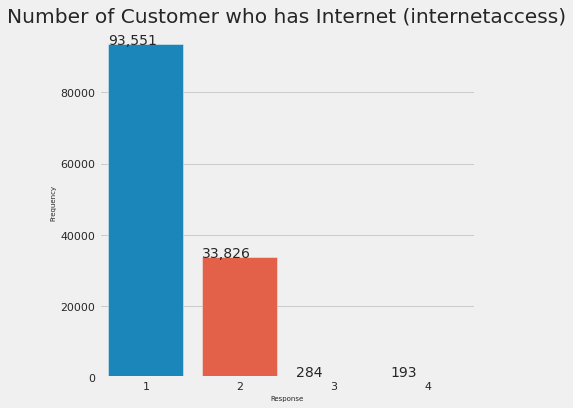

In [ ]:
# visualzing number of customers' who has a mobile phone
# mobileowner

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['mobileowner'])
plt.title('Number of Customer who has a Mobile(mobileowner)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

# visualzing number of customers' who has internet access
# internetaccess

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['internetaccess'])
plt.title('Number of Customer who has Internet (internetaccess)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

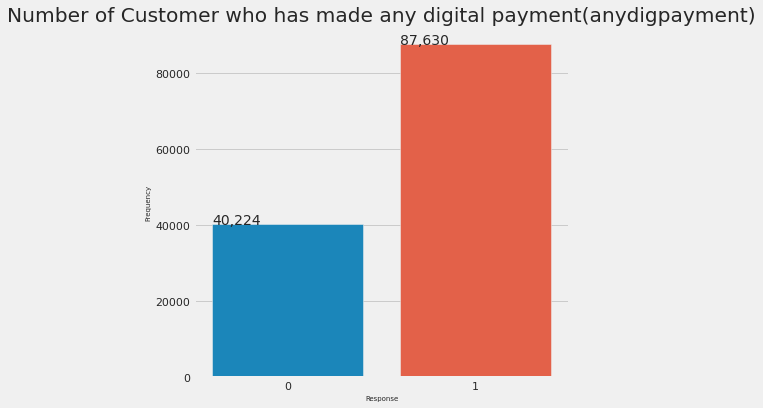

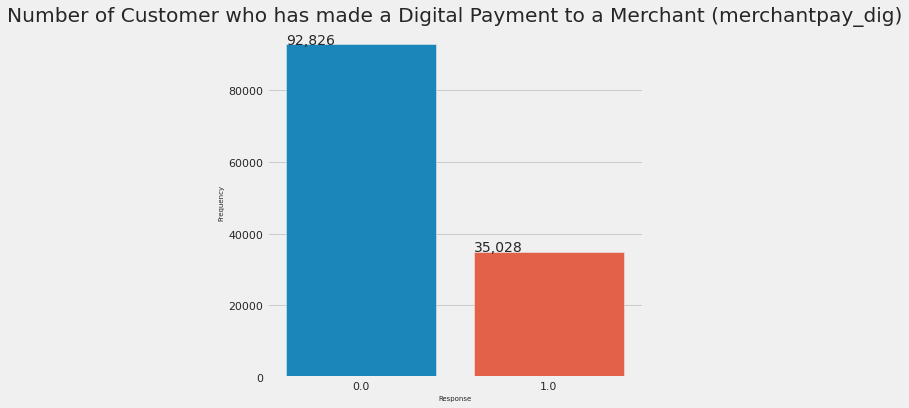

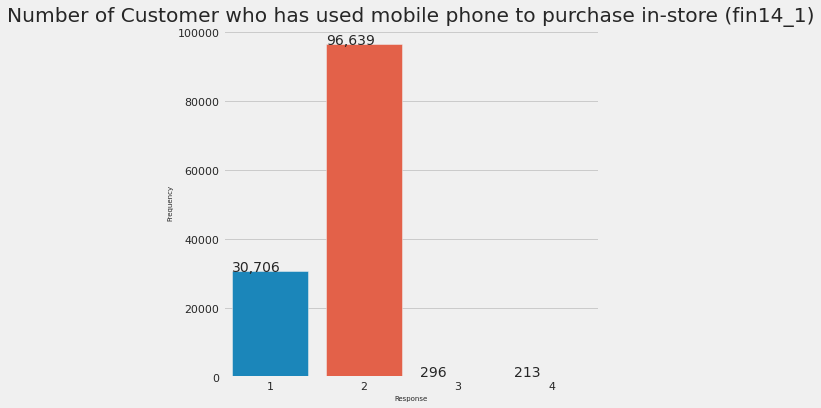

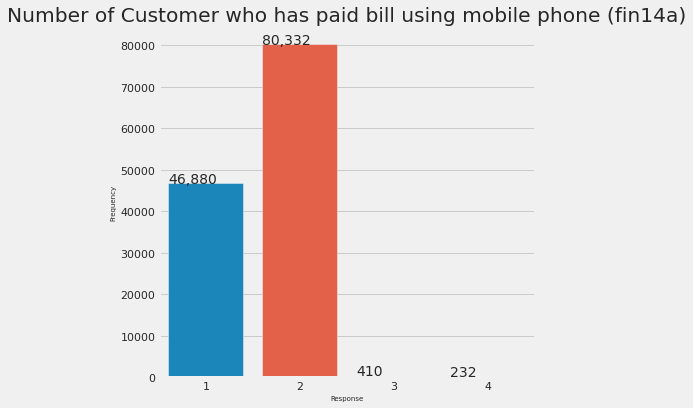

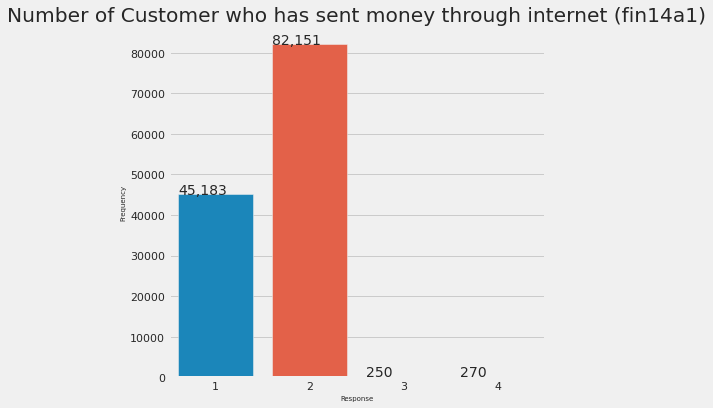

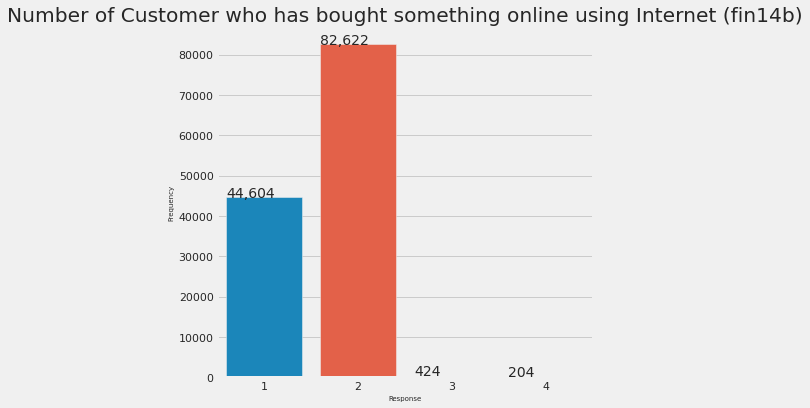

In [ ]:
# visualzing number of customers' who has made any digital payment
# anydigpayment

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['anydigpayment'])
plt.title('Number of Customer who has made any digital payment(anydigpayment)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

# visualzing number of customers' who has made digital payment to a Merchant
# merchantpay_dig

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['merchantpay_dig'])
plt.title('Number of Customer who has made a Digital Payment to a Merchant (merchantpay_dig)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

# visualzing number of customers' who has used mobile phone to purchase in-store
# fin14_1

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin14_1'])
plt.title('Number of Customer who has used mobile phone to purchase in-store (fin14_1)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

# visualzing number of customers' who has paid bill using mobile phone
# fin14a

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin14a'])
plt.title('Number of Customer who has paid bill using mobile phone (fin14a)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

# visualzing number of customers' who sent money through internet
# fin14a1

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin14a1'])
plt.title('Number of Customer who has sent money through internet (fin14a1)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

# visualzing number of customers' who has bought something online using Internet
# fin14b

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin14b'])
plt.title('Number of Customer who has bought something online using Internet (fin14b)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

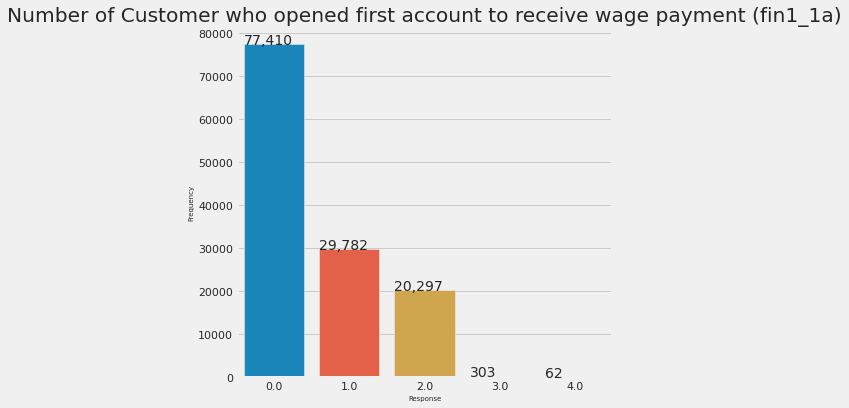

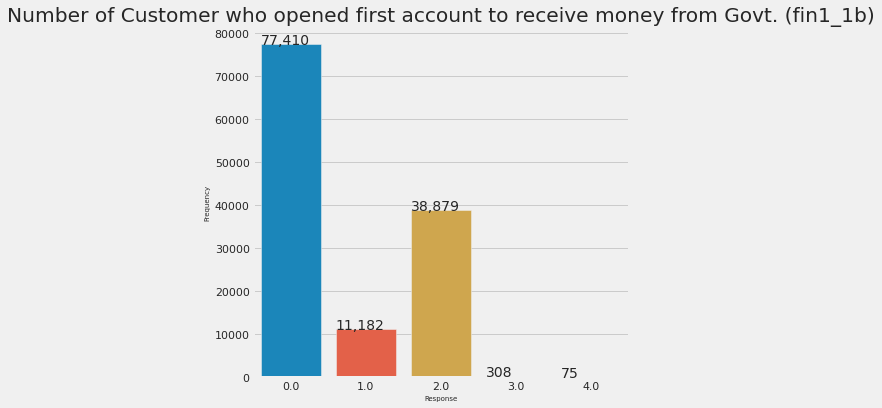

In [ ]:
# visualzing number of customers' who opened first account to receive wage payment
# fin1_1a

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin1_1a'])
plt.title('Number of Customer who opened first account to receive wage payment (fin1_1a)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

# visualzing number of customers' who opened first account to receive money from Govt.
# fin1_1b

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin1_1b'])
plt.title('Number of Customer who opened first account to receive money from Govt. (fin1_1b)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

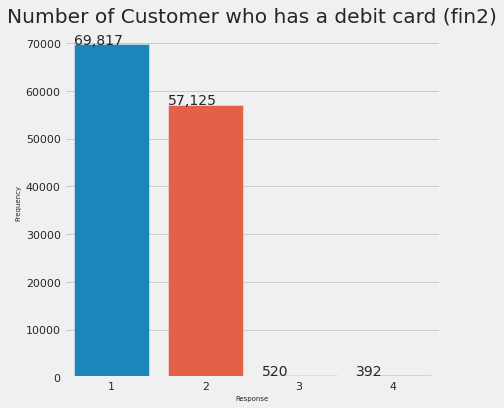

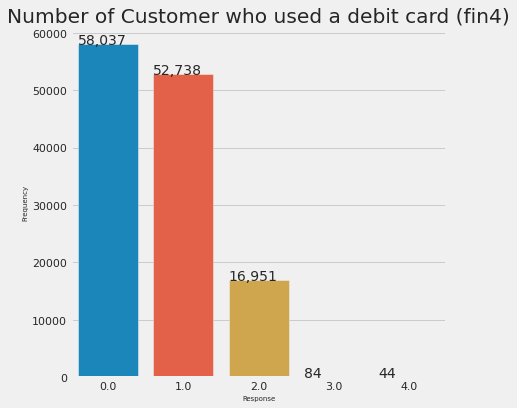

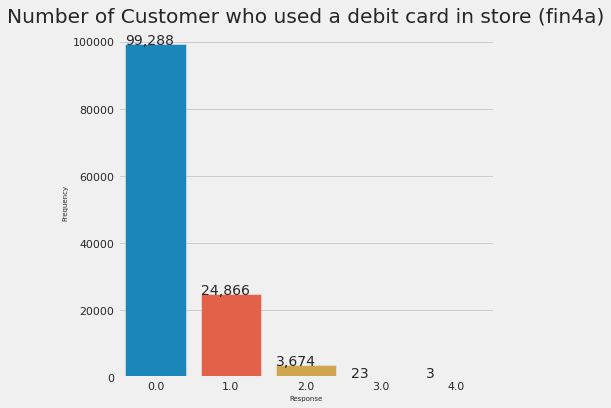

In [ ]:
# visualzing number of customers' who has a debit card
# fin2

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin2'])
plt.title('Number of Customer who has a debit card (fin2)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

# visualzing number of customers' who used a debit card
# fin4

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin4'])
plt.title('Number of Customer who used a debit card (fin4)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

# visualzing number of customers' who used a debit card in store
# fin4a

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin4a'])
plt.title('Number of Customer who used a debit card in store (fin4a)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

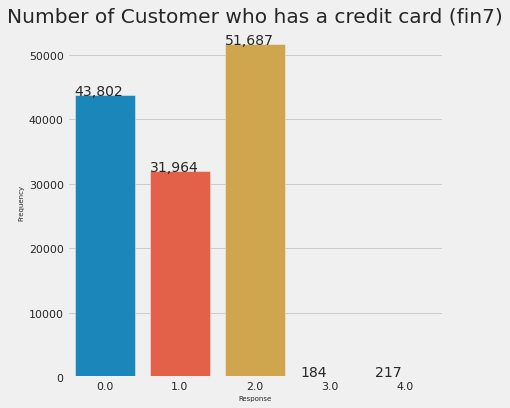

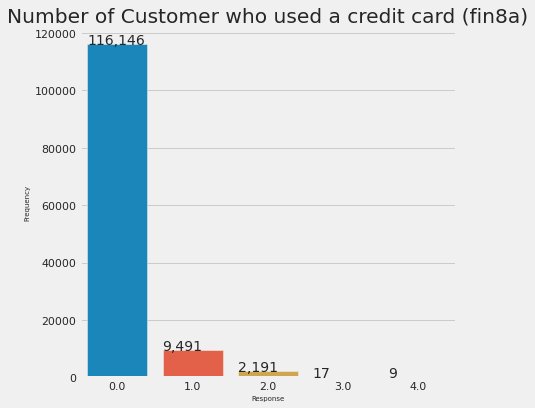

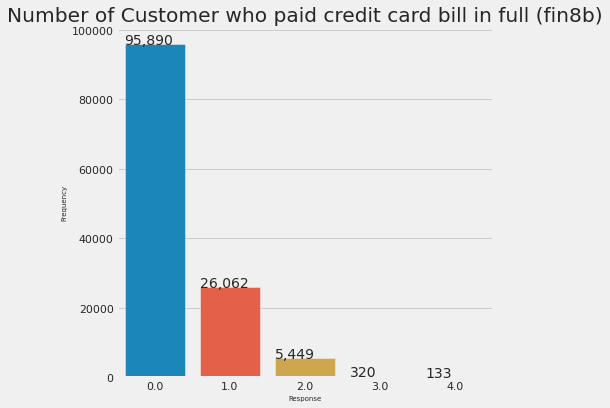

In [ ]:
# visualzing number of customers' who has a credit card
# fin7

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin7'])
plt.title('Number of Customer who has a credit card (fin7)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

# visualzing number of customers' who used credit card
# fin8a

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin8a'])
plt.title('Number of Customer who used a credit card (fin8a)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

# visualzing number of customers' who paid credit card bill in full
# fin8b

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin8b'])
plt.title('Number of Customer who paid credit card bill in full (fin8b)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

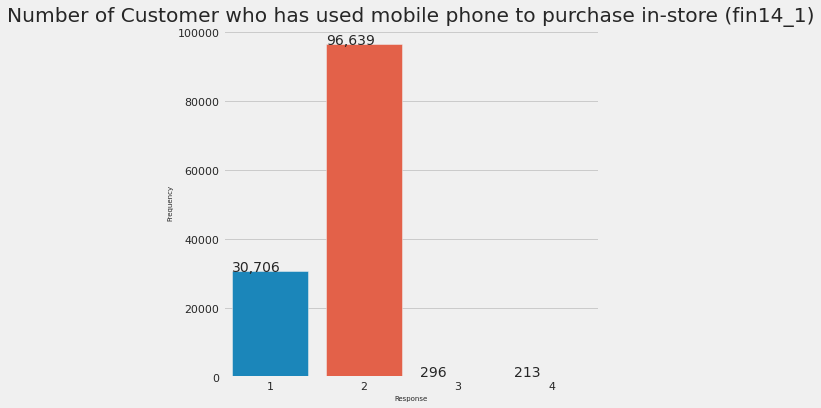

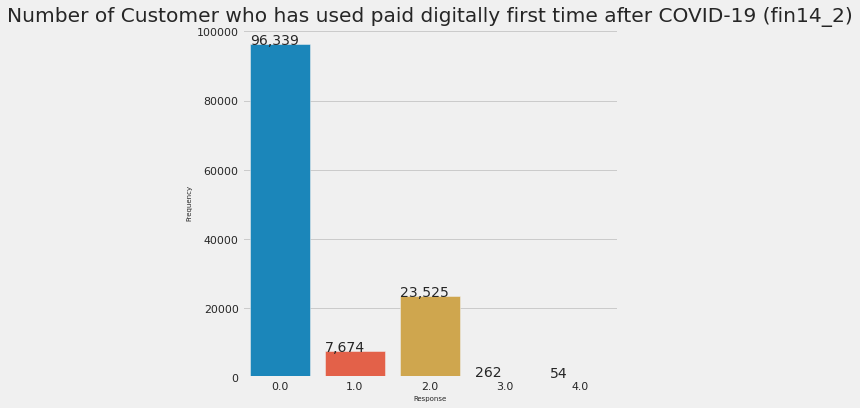

In [ ]:
# visualzing number of customers' who has used mobile phone to purchase in-store
# fin14_1

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin14_1'])
plt.title('Number of Customer who has used mobile phone to purchase in-store (fin14_1)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

# visualzing number of customers' who has used paid digitally first time after COVID-19
# fin14_2

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin14_2'])
plt.title('Number of Customer who has used paid digitally first time after COVID-19 (fin14_2)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

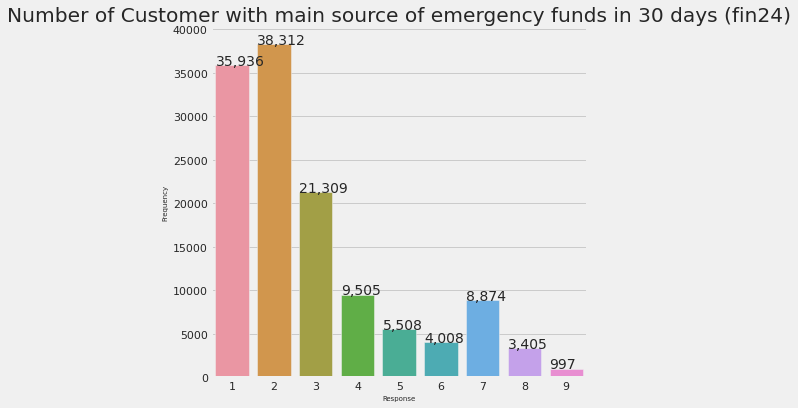

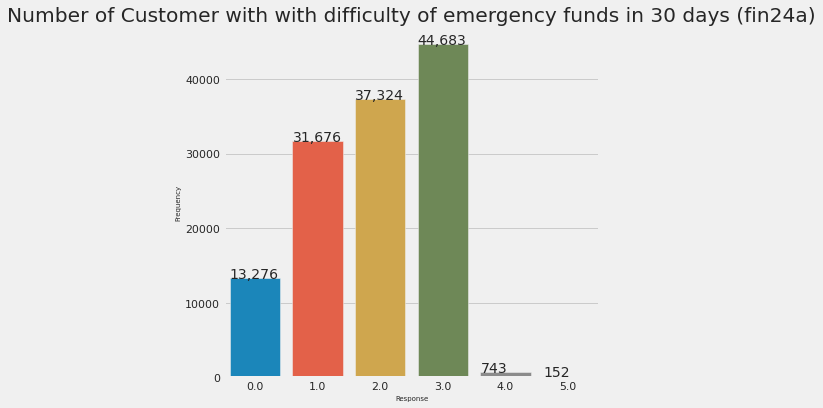

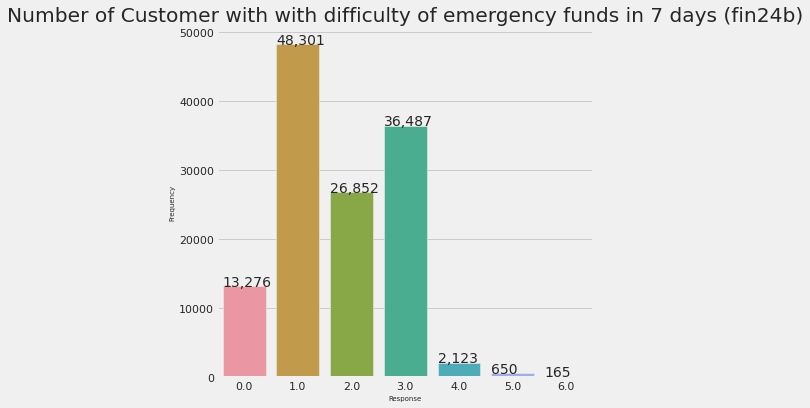

In [ ]:
# visualzing number of customers' with main source of emergency funds in 30 days
# fin24

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin24'])
plt.title('Number of Customer with main source of emergency funds in 30 days (fin24)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

# visualzing number of customers' with difficulty of emergency funds in 30 days
# fin24a

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin24a'])
plt.title('Number of Customer with with difficulty of emergency funds in 30 days (fin24a)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

# visualzing number of customers' with difficulty of emergency funds in 7 days
# fin24b

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin24b'])
plt.title('Number of Customer with with difficulty of emergency funds in 7 days (fin24b)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

print('\n')

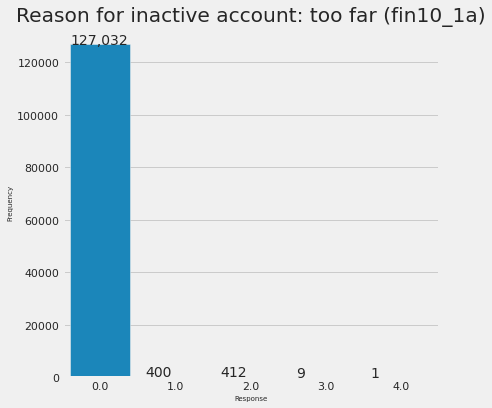

In [ ]:
# visualzing number of customers' with Reason for inactive account: too far
# 'fin10_1a'

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(df['fin10_1a'])
plt.title('Reason for inactive account: too far (fin10_1a)', fontweight = 3)
plt.xlabel('Response' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

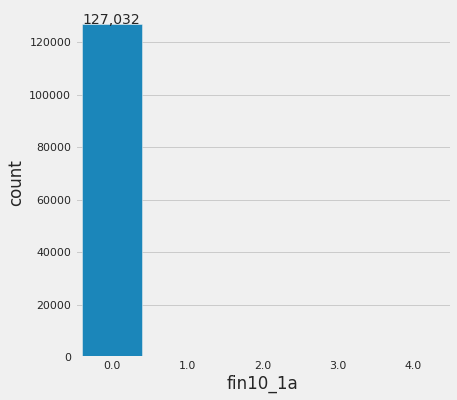

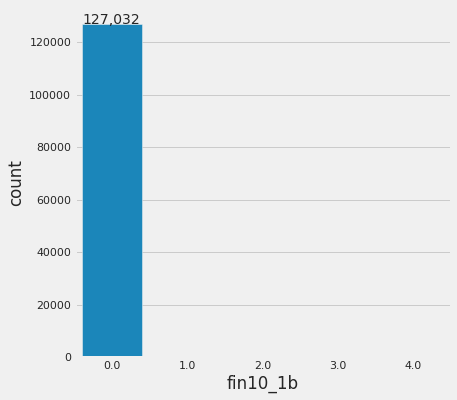

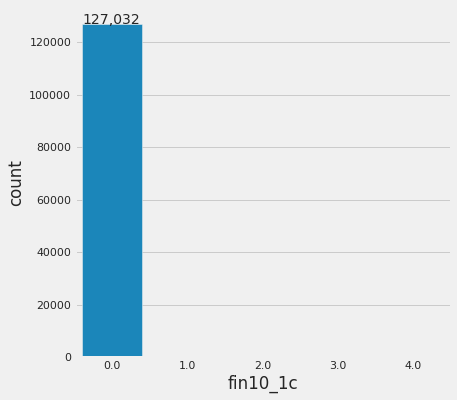

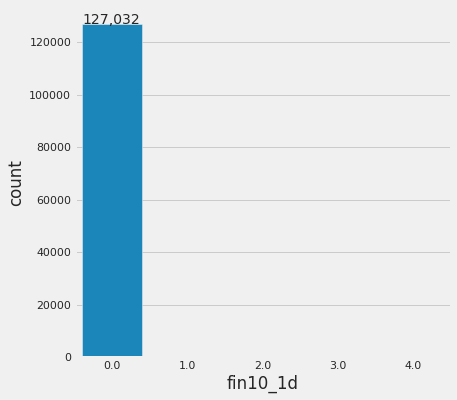

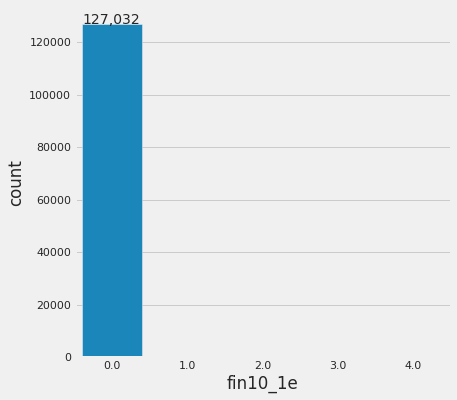

In [ ]:
df1 = df[['fin10_1a', 'fin10_1b', 'fin10_1c', 'fin10_1d', 'fin10_1e']].copy()
for i, col in enumerate(df1.columns):
    plt.figure(i)
    ax = sb.countplot(x=col, data=df1)
    for p in ax.patches:
      ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
      plt.show()

In [ ]:
# a = df1[df1['fin10_1a'] == 4]
# a

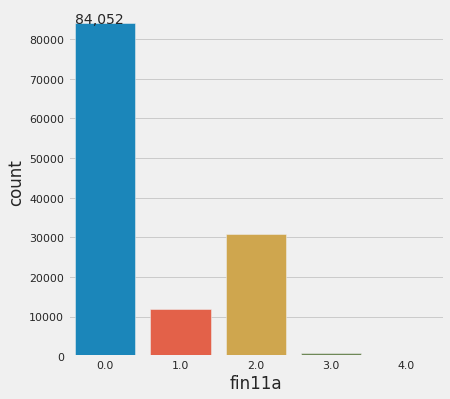

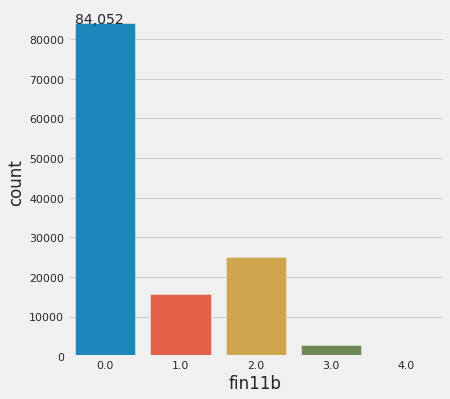

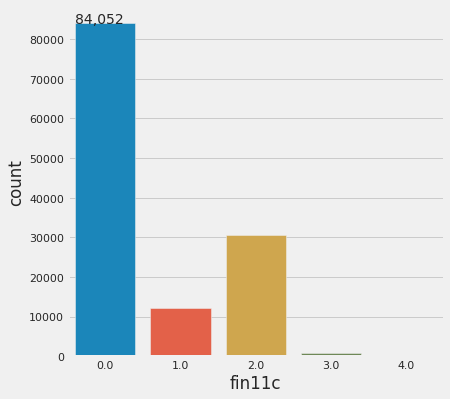

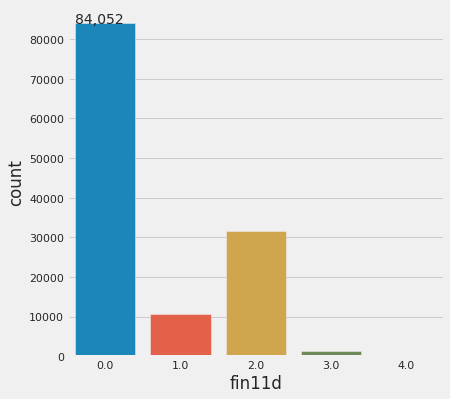

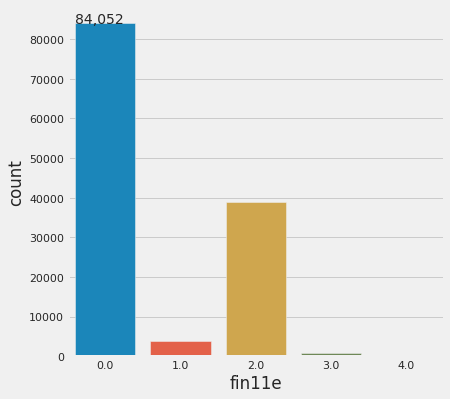

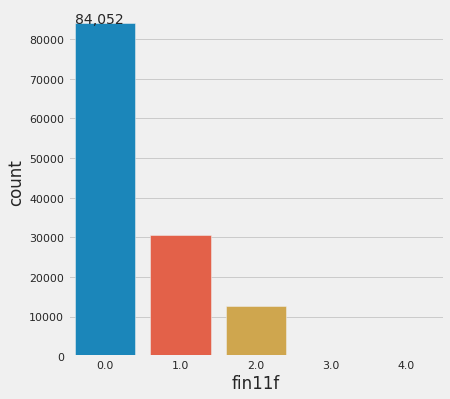

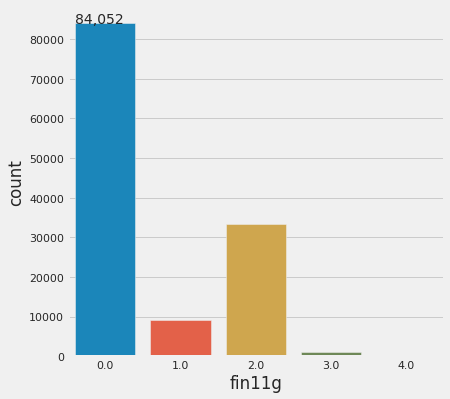

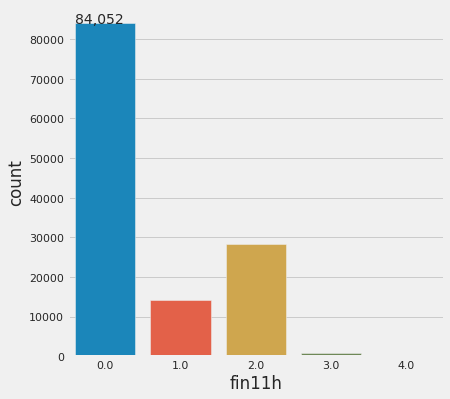

In [ ]:
df2 = df[['fin11a', 'fin11b', 'fin11c', 'fin11d', 'fin11e', 'fin11f', 'fin11g', 'fin11h']].copy()
for i, col in enumerate(df2.columns):
    plt.figure(i)
    ax = sb.countplot(x=col, data=df2)
    for p in ax.patches:
      ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
      plt.show()

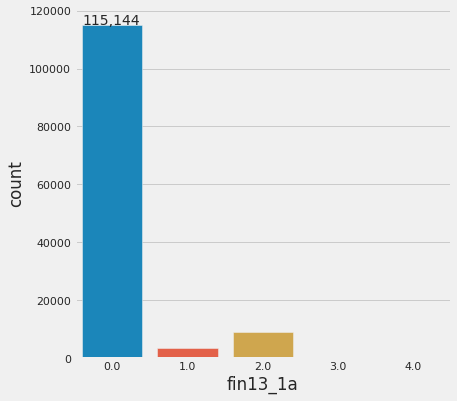

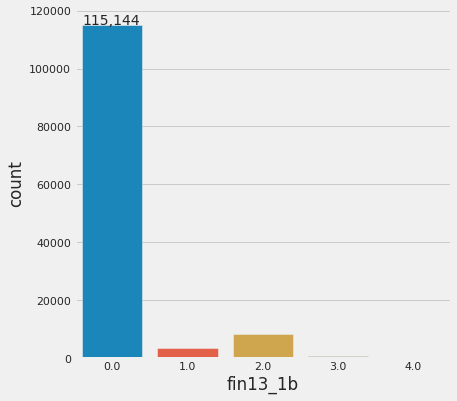

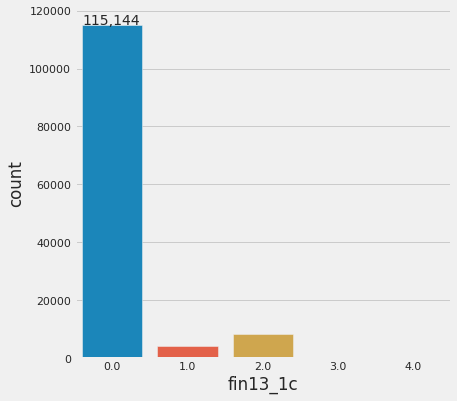

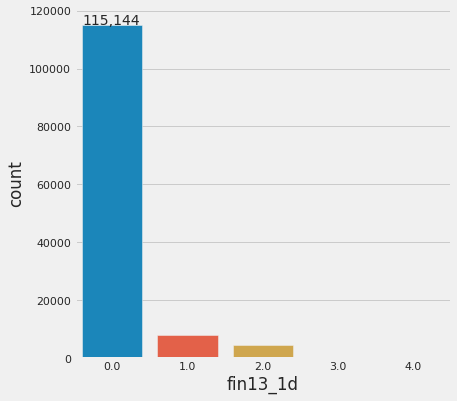

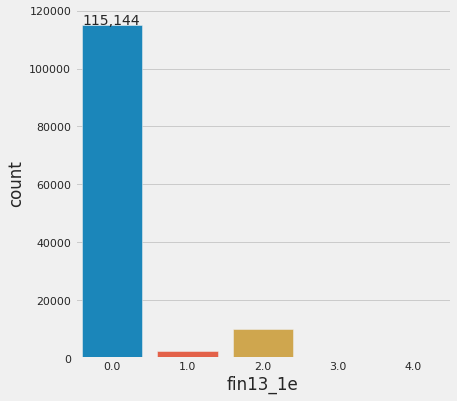

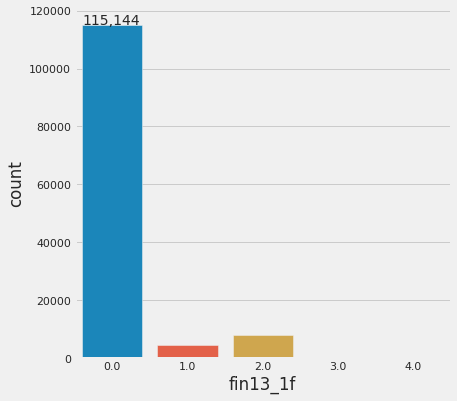

In [ ]:
df3 = df[['fin13_1a', 'fin13_1b', 'fin13_1c', 'fin13_1d', 'fin13_1e', 'fin13_1f']].copy()
for i, col in enumerate(df3.columns):
    plt.figure(i)
    ax = sb.countplot(x=col, data=df3)
    for p in ax.patches:
      ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
      plt.show()

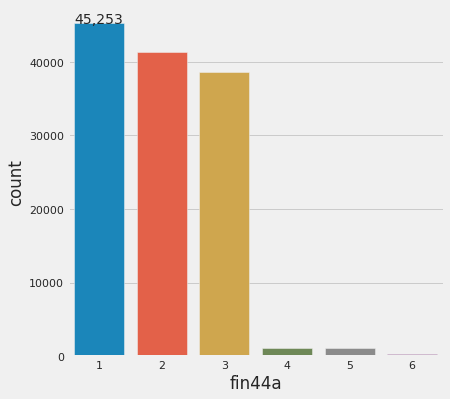

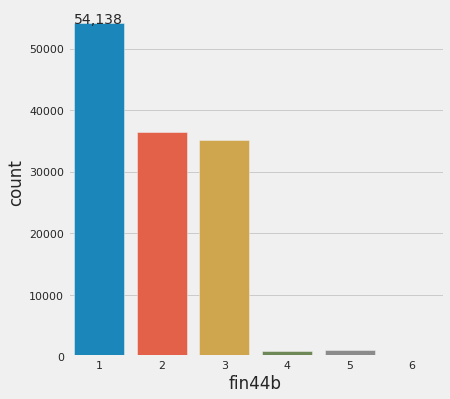

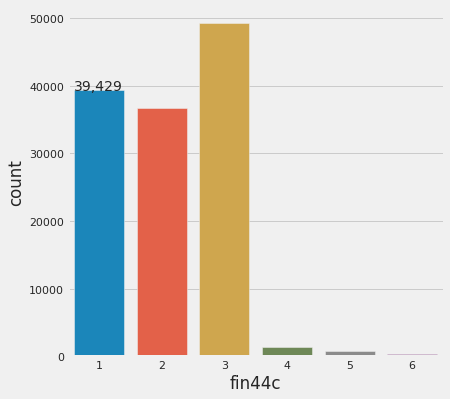

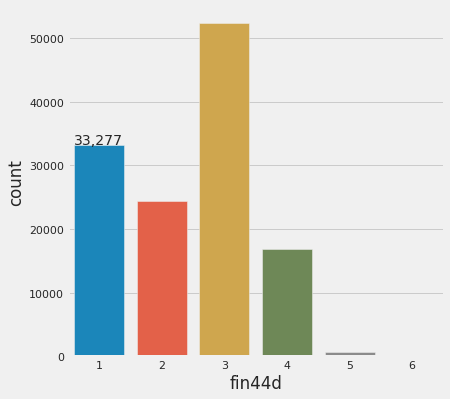

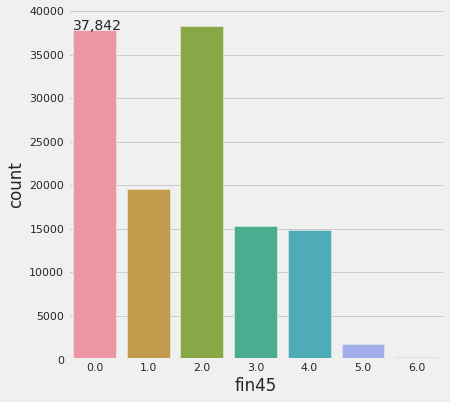

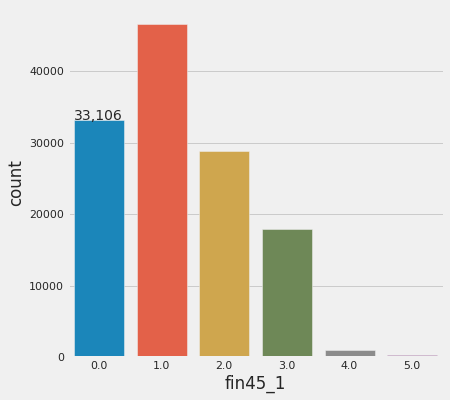

In [ ]:
df4 = df[['fin44a', 'fin44b', 'fin44c', 'fin44d', 'fin45', 'fin45_1']].copy()
for i, col in enumerate(df4.columns):
    plt.figure(i)
    ax = sb.countplot(x=col, data=df4)
    for p in ax.patches:
      ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
      plt.show()

#### Dropping Columns which are Either Similar or Contains Data for a Single Specific Country.

In [ ]:
data = df.drop(['wgt','pop_adult','economy', 'regionwb', 'wpid_random','fin17a1', 'fin22c', 'fin27_1', 'fin27c1','fin27c2', 'fin29_1', 'fin29c1','fin29c2', 'fin31a',
                'fin31b', 'fin31c','fin33', 'fin34a', 'fin34b','fin34d', 'fin34e', 'fin39a', 'fin39b', 'fin39d',
                'fin39e', 'fin43a','fin43b', 'fin43e','account_fin', 'account_mob', 'fin20', 'fin22a', 'fin22b',
                'fin16', 'fin17a1', 'fin17a' ,'fin17b', 'receive_wages', 'receive_transfers', 'receive_pension',
                'receive_agriculture', 'pay_utilities', 'fin14_1', 'fin14a','fin14a1', 'fin14b', 'fin43d', 'fin10_1a',
                'fin10_1b', 'fin10_1c', 'fin10_1d', 'fin10_1e', 'fin13_1a', 'fin13_1b', 'fin13_1c', 'fin13_1d', 'fin13_1e', 'fin13_1f'], axis = 1)

In [ ]:
data.shape

(127854, 66)

In [ ]:
data['age'].isnull().sum()

455

In [ ]:
data['age'].fillna(int(data['age'].mean()), inplace=True)
data['age'].isnull().sum()

0

In [ ]:
data['fin42'].isnull().sum()

29606

In [ ]:
data['fin42'].fillna(4, inplace=True)
data['fin42'].isnull().sum()

0

In [ ]:
pd.set_option('display.max_columns', None)
data.head()

,economycode,female,age,educ,inc_q,emp_in,urbanicity_f2f,account,fin1_1a,fin1_1b,fin2,fin4,fin4a,fin5,fin6,fin7,fin8,fin8a,fin8b,fin9,fin9a,fin10,fin10a,fin10b,fin11_1,fin11a,fin11b,fin11c,fin11d,fin11e,fin11f,fin11g,fin11h,fin13a,fin13b,fin13c,fin13d,fin14_2,fin14c,fin14c_2,fin24,fin24a,fin24b,fin26,fin28,fin30,fin31b1,fin32,fin35,fin37,fin38,fin42,fin42a,fin44a,fin44b,fin44c,fin44d,fin45,fin45_1,saved,borrowed,remittances,mobileowner,internetaccess,anydigpayment,merchantpay_dig
0,AFG,1,19.0,2,4,2.0,1.0,0,0.0,0.0,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,1.0,1.0,1.0,3.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7,0.0,0.0,2.0,2.0,2,0.0,2,0.0,2,2,2.0,0.0,3,2,2,1,2.0,2.0,0,0,5.0,1,2,0,0.0
1,AFG,1,40.0,1,5,2.0,1.0,0,0.0,0.0,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,2.0,1.0,2.0,1.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8,0.0,0.0,2.0,2.0,2,0.0,2,0.0,2,2,2.0,0.0,2,1,1,1,2.0,1.0,0,1,5.0,1,2,0,0.0
2,AFG,1,25.0,1,1,2.0,2.0,0,0.0,0.0,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2,1.0,4.0,2.0,2.0,2,0.0,2,0.0,2,2,2.0,0.0,1,1,1,1,2.0,1.0,0,1,5.0,1,2,0,0.0
3,AFG,1,40.0,1,4,2.0,2.0,0,0.0,0.0,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7,0.0,0.0,2.0,2.0,2,0.0,2,0.0,2,2,2.0,0.0,3,3,2,2,4.0,3.0,0,1,5.0,2,2,0,0.0
4,AFG,2,27.0,3,1,1.0,1.0,1,1.0,2.0,2,0.0,0.0,2.0,2.0,2.0,0.0,0.0,0.0,2.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2,2.0,2.0,2.0,2.0,2,0.0,1,2.0,2,2,2.0,0.0,1,1,2,2,2.0,1.0,0,1,5.0,1,1,1,0.0


In [ ]:
int64 = data.dtypes[data.dtypes == 'int64']
float64 = data.dtypes[data.dtypes == 'float64']
Object = data.dtypes[data.dtypes == 'object']

In [ ]:
int64

female            int64
educ              int64
inc_q             int64
account           int64
fin2              int64
fin24             int64
fin30             int64
fin32             int64
fin37             int64
fin38             int64
fin44a            int64
fin44b            int64
fin44c            int64
fin44d            int64
saved             int64
borrowed          int64
mobileowner       int64
internetaccess    int64
anydigpayment     int64
dtype: object

In [ ]:
float64

age                float64
emp_in             float64
urbanicity_f2f     float64
fin1_1a            float64
fin1_1b            float64
fin4               float64
fin4a              float64
fin5               float64
fin6               float64
fin7               float64
fin8               float64
fin8a              float64
fin8b              float64
fin9               float64
fin9a              float64
fin10              float64
fin10a             float64
fin10b             float64
fin11_1            float64
fin11a             float64
fin11b             float64
fin11c             float64
fin11d             float64
fin11e             float64
fin11f             float64
fin11g             float64
fin11h             float64
fin13a             float64
fin13b             float64
fin13c             float64
fin13d             float64
fin14_2            float64
fin14c             float64
fin14c_2           float64
fin24a             float64
fin24b             float64
fin26              float64
f

In [ ]:
Object

economycode    object
dtype: object

In [ ]:
# To check if any null value is present or no
d = data.isnull().sum()!=0
d.to_csv("df.csv", index = True)

In [ ]:
!pip install category_encoders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.2/81.2 KB 3.7 MB/s eta 0:00:00


In [ ]:
# from category_encoder import BinaryEncoder
# BinaryEncoder(cols=['economycode']).fit(data).transform(data)

data01 = data.copy()

import category_encoders as ce

encoder = ce.BinaryEncoder(cols=['economycode'])
Data = encoder.fit_transform(data01)
Data.to_csv("Encoded_data.csv" , index = False)
data_encoded = pd.read_csv("Encoded_data.csv")
data_encoded.head()

,economycode_0,economycode_1,economycode_2,economycode_3,economycode_4,economycode_5,economycode_6,female,age,educ,inc_q,emp_in,urbanicity_f2f,account,fin1_1a,fin1_1b,fin2,fin4,fin4a,fin5,fin6,fin7,fin8,fin8a,fin8b,fin9,fin9a,fin10,fin10a,fin10b,fin11_1,fin11a,fin11b,fin11c,fin11d,fin11e,fin11f,fin11g,fin11h,fin13a,fin13b,fin13c,fin13d,fin14_2,fin14c,fin14c_2,fin24,fin24a,fin24b,fin26,fin28,fin30,fin31b1,fin32,fin35,fin37,fin38,fin42,fin42a,fin44a,fin44b,fin44c,fin44d,fin45,fin45_1,saved,borrowed,remittances,mobileowner,internetaccess,anydigpayment,merchantpay_dig
0,0,0,0,0,0,0,1,1,19.0,2,4,2.0,1.0,0,0.0,0.0,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,1.0,1.0,1.0,3.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7,0.0,0.0,2.0,2.0,2,0.0,2,0.0,2,2,2.0,0.0,3,2,2,1,2.0,2.0,0,0,5.0,1,2,0,0.0
1,0,0,0,0,0,0,1,1,40.0,1,5,2.0,1.0,0,0.0,0.0,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,2.0,1.0,2.0,1.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8,0.0,0.0,2.0,2.0,2,0.0,2,0.0,2,2,2.0,0.0,2,1,1,1,2.0,1.0,0,1,5.0,1,2,0,0.0
2,0,0,0,0,0,0,1,1,25.0,1,1,2.0,2.0,0,0.0,0.0,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2,1.0,4.0,2.0,2.0,2,0.0,2,0.0,2,2,2.0,0.0,1,1,1,1,2.0,1.0,0,1,5.0,1,2,0,0.0
3,0,0,0,0,0,0,1,1,40.0,1,4,2.0,2.0,0,0.0,0.0,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7,0.0,0.0,2.0,2.0,2,0.0,2,0.0,2,2,2.0,0.0,3,3,2,2,4.0,3.0,0,1,5.0,2,2,0,0.0
4,0,0,0,0,0,0,1,2,27.0,3,1,1.0,1.0,1,1.0,2.0,2,0.0,0.0,2.0,2.0,2.0,0.0,0.0,0.0,2.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2,2.0,2.0,2.0,2.0,2,0.0,1,2.0,2,2,2.0,0.0,1,1,2,2,2.0,1.0,0,1,5.0,1,1,1,0.0


In [ ]:
data_encoded.shape

(127854, 72)

In [ ]:
data_spearman = data_encoded.drop(['economycode_0', 'economycode_1', 'economycode_2', 'economycode_3', 'economycode_4', 'economycode_5', 'economycode_6','account', 'fin24', 'fin24a', 'fin24b', 'fin42a', 'fin44a', 'fin44b', 'fin44c', 'fin44d', 'fin45', 'fin45_1', 'saved', 'borrowed',
                                         'remittances', 'anydigpayment', 'merchantpay_dig', 'female', 'age', 'educ', 'inc_q', 'urbanicity_f2f'], axis = 1)

In [ ]:
def display_correlation(df):
    plt.figure(figsize=(12,12))
    r = df.corr(method="spearman")
    kot = r[r>=.8]
    heatmap = sb.heatmap(kot, cmap="Reds")
    plt.title("Spearman Correlation")
    return(r)

In [ ]:
def display_corr_pairs(df,color="cyan"):
    s = set_title = np.vectorize(lambda ax,r,rho: ax.title.set_text("r = " +
                                        "{:.2f}".format(r) +
                                        '\n $\\rho$ = ' +
                                        "{:.2f}".format(rho)) if ax!=None else None
                            )

    plt.figure(figsize=(30,30))
    r = display_correlation(df)
    rho = df.corr(method="spearman")
    # g = sb.PairGrid(df,corner=True)
    # g.map_diag(plt.hist,color="yellow")
    # g.map_lower(sb.scatterplot,color="magenta")
    # set_title(g.axes,r,rho)
    # plt.subplots_adjust(hspace = 0.6)
    # plt.show()

<Figure size 2160x2160 with 0 Axes>

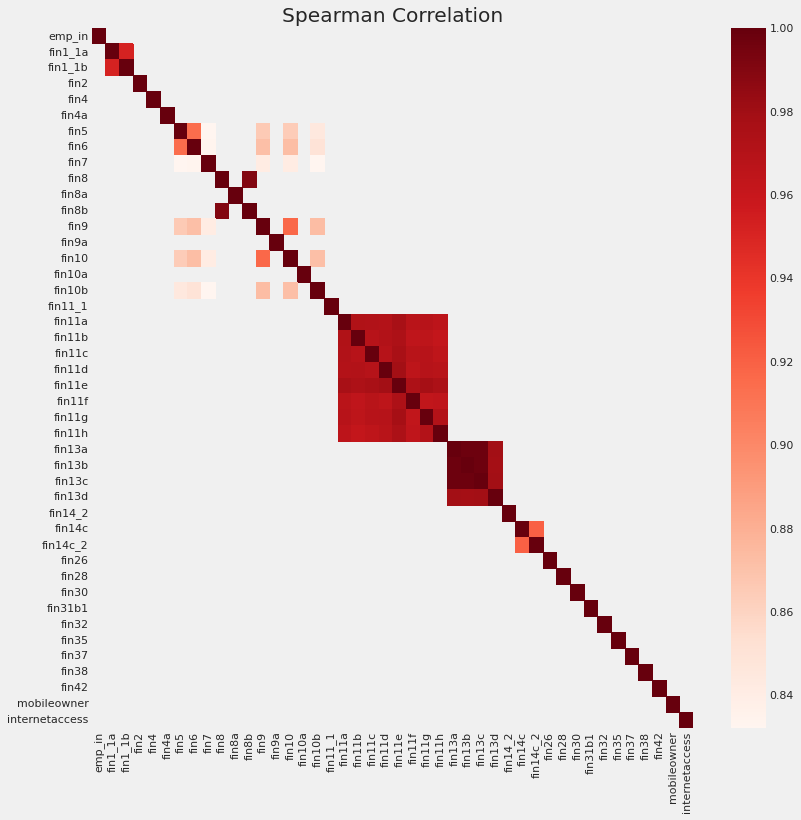

In [ ]:
display_corr_pairs(data_spearman)

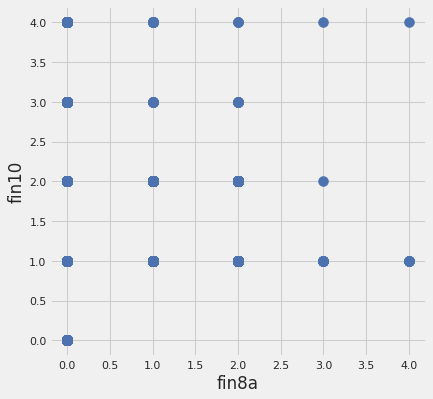

In [ ]:
data_spearman.plot.scatter(x = 'fin8a', y = 'fin10', s = 100);

In [ ]:
pca_data1 = data_spearman[['fin11a', 'fin11b', 'fin11c', 'fin11d', 'fin11e', 'fin11f', 'fin11g', 'fin11h']].copy()
pca_data2 = data_spearman[['fin13a', 'fin13b', 'fin13c', 'fin13d']].copy()
pca_data3 = data_spearman[['fin26', 'fin28']].copy()
pca_data4 = data_spearman[['fin1_1a', 'fin1_1a']].copy()
pca_data5 = data_encoded[['fin44a', 'fin44b', 'fin44c', 'fin44d', 'fin45', 'fin45_1']].copy()
pca_data6 = data_encoded[['fin2', 'fin4', 'fin4a','fin5', 'fin6', 'fin7', 'fin8', 'fin8a','fin8a', 'fin9', 'fin9a', 'fin10', 'fin10a', 'fin10b']].copy()
pca_data7 = data_encoded[['fin24', 'fin24a', 'fin24b']].copy()

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca1 = PCA(n_components = 3)
data_pca_fin11 = pca1.fit_transform(pca_data1)
data_pca_fin11

array([[ 2.27300234e+00, -9.98439911e-04,  2.42274070e-01],
       [ 2.59853774e+00, -9.19571578e-01,  5.99932784e-02],
       [ 3.95066829e+00,  2.87570579e-02,  4.35716209e-01],
       ...,
       [ 3.31173623e+00,  4.10009020e-01, -1.79720765e-01],
       [ 2.95619406e+00, -2.98074794e-01,  9.61566451e-02],
       [ 3.32221843e+00, -1.58826106e-01, -4.55453224e-01]])

In [ ]:
data_pca_fin11.shape

(127854, 3)

In [ ]:
fin11_df = pd.DataFrame(data_pca_fin11, columns=['PC1','PC2', 'PC3'])
fin11_df.head()

,PC1,PC2,PC3
0,2.273002,-0.000998,0.242274
1,2.598538,-0.919572,0.059993
2,3.950668,0.028757,0.435716
3,3.333039,0.565468,-0.268045
4,-1.681245,0.009474,-0.000888


In [ ]:
fin11_df.shape

(127854, 3)

In [ ]:
pca2 = PCA(n_components = 2)
data_pca_fin13 = pca2.fit_transform(pca_data2)
data_pca_fin13

array([[-0.3488475 , -0.00468684],
       [-0.3488475 , -0.00468684],
       [-0.3488475 , -0.00468684],
       ...,
       [-0.3488475 , -0.00468684],
       [-0.3488475 , -0.00468684],
       [-0.3488475 , -0.00468684]])

In [ ]:
fin13_df = pd.DataFrame(data_pca_fin13, columns=['PC1','PC2'])
fin13_df.head()

,PC1,PC2
0,-0.348848,-0.004687
1,-0.348848,-0.004687
2,-0.348848,-0.004687
3,-0.348848,-0.004687
4,-0.348848,-0.004687


In [ ]:
pca3 = PCA(n_components = 1)
data_pca_domestic_remittance = pca3.fit_transform(pca_data3)
data_pca_domestic_remittance

array([[-0.36513877],
       [-0.36513877],
       [-0.36513877],
       ...,
       [-1.07650972],
       [-0.36513877],
       [-0.36513877]])

In [ ]:
pca4 = PCA(n_components = 1)
data_pca_first_account = pca4.fit_transform(pca_data4)
data_pca_first_account

array([[-0.79123796],
       [-0.79123796],
       [-0.79123796],
       ...,
       [-0.79123796],
       [-0.79123796],
       [-0.79123796]])

In [ ]:
domestic_remittance = pd.DataFrame(data_pca_domestic_remittance, columns=['PC1'])
domestic_remittance.head()

,PC1
0,-0.365139
1,-0.365139
2,-0.365139
3,-0.365139
4,-0.365139


In [ ]:
first_account = pd.DataFrame(data_pca_first_account, columns=['PC1'])
first_account.head()

,PC1
0,-0.791238
1,-0.791238
2,-0.791238
3,-0.791238
4,0.622976


In [ ]:
pca5 = PCA(n_components = 3)
data_pca_financially_worried = pca5.fit_transform(pca_data5)
data_pca_financially_worried

array([[-0.43586883,  0.84256537, -0.10712926],
       [-1.5688376 , -0.38900121, -0.76654297],
       [-1.91101642, -0.52903351, -1.1280281 ],
       ...,
       [ 2.47879719,  1.55598868, -0.51410735],
       [-2.20095609, -0.24093114, -0.11154522],
       [-0.373598  ,  1.78607457, -0.34455543]])

In [ ]:
financially_worried = pd.DataFrame(data_pca_financially_worried, columns=['PC1','PC2', 'PC3'])
financially_worried.head()

,PC1,PC2,PC3
0,-0.435869,0.842565,-0.107129
1,-1.568838,-0.389001,-0.766543
2,-1.911016,-0.529034,-1.128028
3,-0.953477,2.362279,1.688410
4,-1.138993,-0.407543,-0.507461


In [ ]:
pca6 = PCA(n_components = 4)
data_pca_initialfin = pca6.fit_transform(pca_data6)
data_pca_initialfin

array([[-2.58842211,  0.06607195, -0.0497083 , -0.0345927 ],
       [-2.58842211,  0.06607195, -0.0497083 , -0.0345927 ],
       [-2.58842211,  0.06607195, -0.0497083 , -0.0345927 ],
       ...,
       [-2.58842211,  0.06607195, -0.0497083 , -0.0345927 ],
       [-2.58842211,  0.06607195, -0.0497083 , -0.0345927 ],
       [-2.58842211,  0.06607195, -0.0497083 , -0.0345927 ]])

In [ ]:
basic_fin = pd.DataFrame(data_pca_initialfin, columns=['PC1','PC2', 'PC3', 'PC4'])
basic_fin.head()

,PC1,PC2,PC3,PC4
0,-2.588422,0.066072,-0.049708,-0.034593
1,-2.588422,0.066072,-0.049708,-0.034593
2,-2.588422,0.066072,-0.049708,-0.034593
3,-2.588422,0.066072,-0.049708,-0.034593
4,1.226600,2.346549,0.157797,0.777840


In [ ]:
pca7 = PCA(n_components = 1)
data_emergencyfunds = pca7.fit_transform(pca_data7)
data_emergencyfunds

array([[ 4.8876569 ],
       [ 5.75710946],
       [-1.2017656 ],
       ...,
       [ 4.8876569 ],
       [ 4.8876569 ],
       [-1.20472328]])

In [ ]:
emergencyfunds = pd.DataFrame(data_emergencyfunds, columns=['PC1'])
emergencyfunds.head()

,PC1
0,4.887657
1,5.757109
2,-1.201766
3,4.887657
4,-0.856883


In [ ]:
data_encoded['fin11'] = fin11_df['PC1']
data_encoded['fin13'] = fin13_df['PC1']
data_encoded['domestic_reittances'] = domestic_remittance['PC1']
data_encoded['first_account'] = first_account['PC1']
data_encoded['financially_worried'] = financially_worried['PC1']
data_encoded['basic_fin'] = basic_fin['PC1']
data_encoded['emergencyfunds'] = emergencyfunds['PC1']

In [ ]:
data_encoded = data_encoded.drop(['fin11a', 'fin11b', 'fin11c', 'fin11d', 'fin11e', 'fin11f', 'fin11g', 'fin11h','fin13a', 'fin13b', 'fin13c', 'fin13d', 'fin44a', 'fin44b', 'fin44c', 'fin44d', 'fin45', 'fin45_1', 'fin1_1a', 'fin1_1b', 'fin26', 'fin28', 'fin2', 'fin4', 'fin4a','fin5', 'fin6', 'fin7', 'fin8', 'fin8a','fin8b', 'fin9', 'fin9a', 'fin10', 'fin10a', 'fin10b', 'fin24', 'fin24a', 'fin24b'], axis = 1)

In [ ]:
data_encoded.head()

,economycode_0,economycode_1,economycode_2,economycode_3,economycode_4,economycode_5,economycode_6,female,age,educ,inc_q,emp_in,urbanicity_f2f,account,fin11_1,fin14_2,fin14c,fin14c_2,fin30,fin31b1,fin32,fin35,fin37,fin38,fin42,fin42a,saved,borrowed,remittances,mobileowner,internetaccess,anydigpayment,merchantpay_dig,fin11,fin13,domestic_reittances,first_account,financially_worried,basic_fin,emergencyfunds
0,0,0,0,0,0,0,1,1,19.0,2,4,2.0,1.0,0,2.0,0.0,0.0,0.0,2,0.0,2,0.0,2,2,2.0,0.0,0,0,5.0,1,2,0,0.0,2.273002,-0.348848,-0.365139,-0.791238,-0.435869,-2.588422,4.887657
1,0,0,0,0,0,0,1,1,40.0,1,5,2.0,1.0,0,1.0,0.0,0.0,0.0,2,0.0,2,0.0,2,2,2.0,0.0,0,1,5.0,1,2,0,0.0,2.598538,-0.348848,-0.365139,-0.791238,-1.568838,-2.588422,5.757109
2,0,0,0,0,0,0,1,1,25.0,1,1,2.0,2.0,0,2.0,0.0,0.0,0.0,2,0.0,2,0.0,2,2,2.0,0.0,0,1,5.0,1,2,0,0.0,3.950668,-0.348848,-0.365139,-0.791238,-1.911016,-2.588422,-1.201766
3,0,0,0,0,0,0,1,1,40.0,1,4,2.0,2.0,0,2.0,0.0,0.0,0.0,2,0.0,2,0.0,2,2,2.0,0.0,0,1,5.0,2,2,0,0.0,3.333039,-0.348848,-0.365139,-0.791238,-0.953477,-2.588422,4.887657
4,0,0,0,0,0,0,1,2,27.0,3,1,1.0,1.0,1,0.0,0.0,0.0,0.0,2,0.0,1,2.0,2,2,2.0,0.0,0,1,5.0,1,1,1,0.0,-1.681245,-0.348848,-0.365139,0.622976,-1.138993,1.226600,-0.856883


In [ ]:
data_encoded.shape

(127854, 40)

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(data_encoded)
data_scaled = scaler.transform(data_encoded)

In [ ]:
data_scaled = pd.DataFrame(data_scaled, columns = ['economycode_0', 'economycode_1', 'economycode_2', 'economycode_3',
                                                   'economycode_4', 'economycode_5', 'economycode_6',
                                                   'female', 'age', 'educ', 'inc_q', 'emp_in', 'urbanicity_f2f',
                                                   'account','fin11_1', 'fin14_2', 'fin14c', 'fin14c_2',
                                                   'fin30', 'fin31b1', 'fin32', 'fin35',
                                                   'fin37', 'fin38', 'fin42', 'fin42a', 'saved', 'borrowed', 'remittances',
                                                   'mobileowner','internetaccess','anydigpayment', 'merchantpay_dig', 'fin11',
                                                   'fin13', 'domestic_reittances', 'first_account', 'financially_worries', 'basic_fin', 'emergencyfunds'])
data_scaled.head()

,economycode_0,economycode_1,economycode_2,economycode_3,economycode_4,economycode_5,economycode_6,female,age,educ,inc_q,emp_in,urbanicity_f2f,account,fin11_1,fin14_2,fin14c,fin14c_2,fin30,fin31b1,fin32,fin35,fin37,fin38,fin42,fin42a,saved,borrowed,remittances,mobileowner,internetaccess,anydigpayment,merchantpay_dig,fin11,fin13,domestic_reittances,first_account,financially_worries,basic_fin,emergencyfunds
0,-0.957134,-0.95865,-0.987949,-0.981371,-1.012609,-0.973477,1.004421,-0.943911,-1.304341,-0.011289,0.537484,1.355940,0.319986,-1.701894,2.093119,-0.548585,-0.44264,-0.439397,1.169931,-0.474242,0.773442,-0.475810,0.466994,0.352056,-0.397438,-0.286295,-1.116548,-1.057943,0.989681,-0.330813,1.576974,-1.475991,-0.614289,0.959357,-0.362098,-0.254006,-0.732124,-0.234056,-1.340584,2.194803
1,-0.957134,-0.95865,-0.987949,-0.981371,-1.012609,-0.973477,1.004421,-0.943911,-0.097939,-1.393748,1.243030,1.355940,0.319986,-1.701894,0.776570,-0.548585,-0.44264,-0.439397,1.169931,-0.474242,0.773442,-0.475810,0.466994,0.352056,-0.397438,-0.286295,-1.116548,0.945230,0.989681,-0.330813,1.576974,-1.475991,-0.614289,1.096755,-0.362098,-0.254006,-0.732124,-0.842446,-1.340584,2.585231
2,-0.957134,-0.95865,-0.987949,-0.981371,-1.012609,-0.973477,1.004421,-0.943911,-0.959655,-1.393748,-1.579154,1.355940,1.497056,-1.701894,2.093119,-0.548585,-0.44264,-0.439397,1.169931,-0.474242,0.773442,-0.475810,0.466994,0.352056,-0.397438,-0.286295,-1.116548,0.945230,0.989681,-0.330813,1.576974,-1.475991,-0.614289,1.667443,-0.362098,-0.254006,-0.732124,-1.026192,-1.340584,-0.539653
3,-0.957134,-0.95865,-0.987949,-0.981371,-1.012609,-0.973477,1.004421,-0.943911,-0.097939,-1.393748,0.537484,1.355940,1.497056,-1.701894,2.093119,-0.548585,-0.44264,-0.439397,1.169931,-0.474242,0.773442,-0.475810,0.466994,0.352056,-0.397438,-0.286295,-1.116548,0.945230,0.989681,2.877786,1.576974,-1.475991,-0.614289,1.406763,-0.362098,-0.254006,-0.732124,-0.512006,-1.340584,2.194803
4,-0.957134,-0.95865,-0.987949,-0.981371,-1.012609,-0.973477,1.004421,1.059422,-0.844759,1.371171,-1.579154,-0.585255,0.319986,0.587581,-0.539979,-0.548585,-0.44264,-0.439397,1.169931,-0.474242,-1.188030,2.161357,0.466994,0.352056,-0.397438,-0.286295,-1.116548,0.945230,0.989681,-0.330813,-0.593787,0.677511,-0.614289,-0.709597,-0.362098,-0.254006,0.576433,-0.611625,0.635275,-0.384783


In [ ]:
import statsmodels.api as sm
from sklearn.cluster import KMeans

In [ ]:
data_clustering = data_scaled.copy()

In [ ]:
x = data_scaled.values

In [ ]:
print(x)

[[-0.95713357 -0.95864977 -0.9879494  ... -0.23405619 -1.34058391
   2.19480282]
 [-0.95713357 -0.95864977 -0.9879494  ... -0.84244648 -1.34058391
   2.58523058]
 [-0.95713357 -0.95864977 -0.9879494  ... -1.02619229 -1.34058391
  -0.53965296]
 ...
 [ 1.04478626  1.04313382  1.01219759 ...  1.33108357 -1.34058391
   2.19480282]
 [ 1.04478626  1.04313382  1.01219759 ... -1.18188632 -1.34058391
   2.19480282]
 [ 1.04478626  1.04313382  1.01219759 ... -0.20061753 -1.34058391
  -0.54098111]]


In [ ]:
wcss = []

for i in range(1,11):
  kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
  kmeans.fit(x)

  wcss.append(kmeans.inertia_)

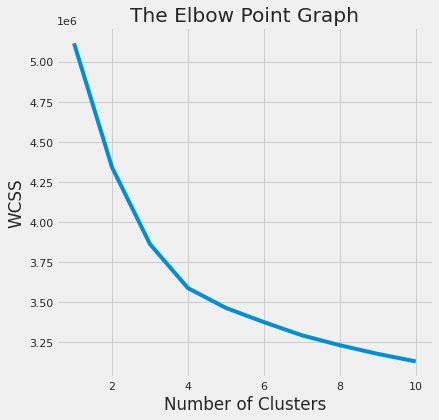

In [ ]:
plt.plot(range(1,11), wcss)
plt.title("The Elbow Point Graph")
plt.xlabel("Number of Clusters")
plt.ylabel("WCSS")
plt.show()

In [ ]:
kmeans = KMeans(2)
kmeans.fit(x)

KMeans(n_clusters=2)

In [ ]:
identified_clusters = kmeans.fit_predict(x)
identified_clusters

array([1, 1, 1, ..., 1, 1, 1], dtype=int32)

In [ ]:
data_with_clusters = data_scaled.drop(['economycode_0','economycode_1', 'economycode_2', 'economycode_3',
                                                   'economycode_4', 'economycode_5', 'economycode_6',
                                                   'female', 'age', 'educ', 'inc_q', 'emp_in', 'urbanicity_f2f', ], axis = 1)
data_with_clusters['Clusters'] = identified_clusters

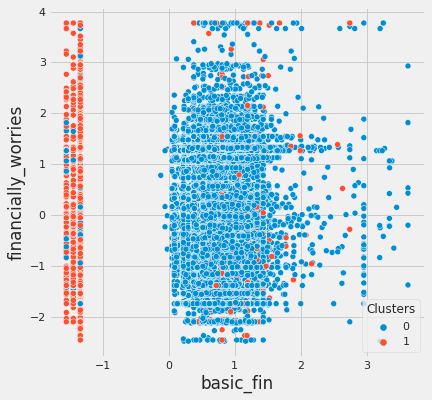

In [ ]:
# Clusters for "Has a Credit Card" and "Paid the Credit Card bill on time"
sb.scatterplot(data_with_clusters['basic_fin'], data_with_clusters['financially_worries'], data=data_with_clusters, hue=data_with_clusters['Clusters'])

plt.show()

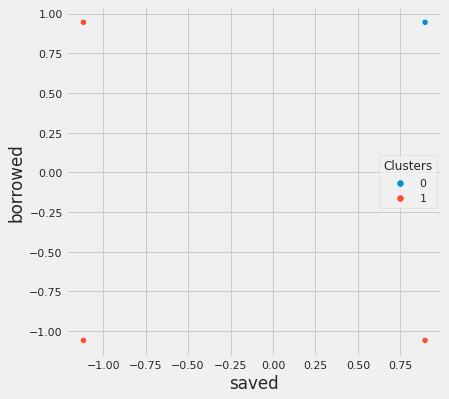

In [ ]:
# Clusters for "Saved" and "Borrowed"
sb.scatterplot(data_with_clusters['saved'], data_with_clusters['borrowed'], data=data_with_clusters, hue=data_with_clusters['Clusters'])

plt.show()

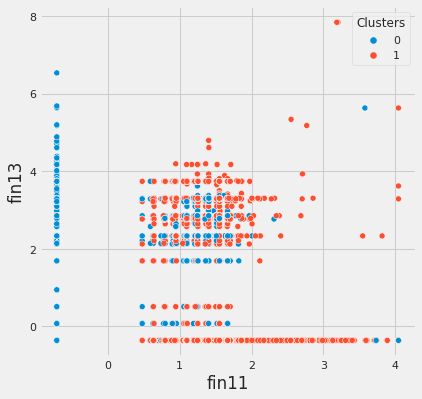

In [ ]:
# Clusters for "Emergency funds in 30 Days" and "Emergency in 7 Days"
sb.scatterplot(data_with_clusters['fin11'], data_with_clusters['fin13'], data=data_with_clusters, hue=data_with_clusters['Clusters'])

plt.show()

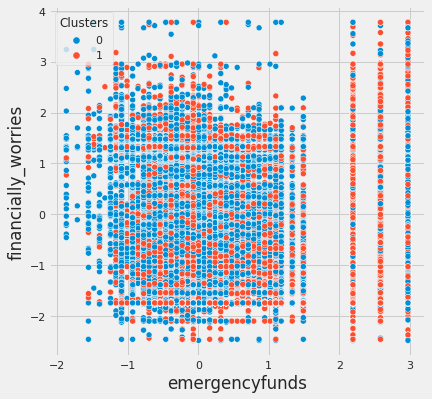

In [ ]:
# Clusters for "Received Wage Payments" and "Received wage payments into an account or to a phone or a card and paid higher than expected bank fees"
sb.scatterplot(data_with_clusters['emergencyfunds'], data_with_clusters['financially_worries'], data=data_with_clusters, hue=data_with_clusters['Clusters'])

plt.show()

In [ ]:
data_with_clusters.shape

(127854, 28)

In [ ]:
data_with_clusters.head()

,account,fin11_1,fin14_2,fin14c,fin14c_2,fin30,fin31b1,fin32,fin35,fin37,fin38,fin42,fin42a,saved,borrowed,remittances,mobileowner,internetaccess,anydigpayment,merchantpay_dig,fin11,fin13,domestic_reittances,first_account,financially_worries,basic_fin,emergencyfunds,Clusters
0,-1.701894,2.093119,-0.548585,-0.44264,-0.439397,1.169931,-0.474242,0.773442,-0.475810,0.466994,0.352056,-0.397438,-0.286295,-1.116548,-1.057943,0.989681,-0.330813,1.576974,-1.475991,-0.614289,0.959357,-0.362098,-0.254006,-0.732124,-0.234056,-1.340584,2.194803,1
1,-1.701894,0.776570,-0.548585,-0.44264,-0.439397,1.169931,-0.474242,0.773442,-0.475810,0.466994,0.352056,-0.397438,-0.286295,-1.116548,0.945230,0.989681,-0.330813,1.576974,-1.475991,-0.614289,1.096755,-0.362098,-0.254006,-0.732124,-0.842446,-1.340584,2.585231,1
2,-1.701894,2.093119,-0.548585,-0.44264,-0.439397,1.169931,-0.474242,0.773442,-0.475810,0.466994,0.352056,-0.397438,-0.286295,-1.116548,0.945230,0.989681,-0.330813,1.576974,-1.475991,-0.614289,1.667443,-0.362098,-0.254006,-0.732124,-1.026192,-1.340584,-0.539653,1
3,-1.701894,2.093119,-0.548585,-0.44264,-0.439397,1.169931,-0.474242,0.773442,-0.475810,0.466994,0.352056,-0.397438,-0.286295,-1.116548,0.945230,0.989681,2.877786,1.576974,-1.475991,-0.614289,1.406763,-0.362098,-0.254006,-0.732124,-0.512006,-1.340584,2.194803,1
4,0.587581,-0.539979,-0.548585,-0.44264,-0.439397,1.169931,-0.474242,-1.188030,2.161357,0.466994,0.352056,-0.397438,-0.286295,-1.116548,0.945230,0.989681,-0.330813,-0.593787,0.677511,-0.614289,-0.709597,-0.362098,-0.254006,0.576433,-0.611625,0.635275,-0.384783,0


In [ ]:
data_with_clusters.tail()

,account,fin11_1,fin14_2,fin14c,fin14c_2,fin30,fin31b1,fin32,fin35,fin37,fin38,fin42,fin42a,saved,borrowed,remittances,mobileowner,internetaccess,anydigpayment,merchantpay_dig,fin11,fin13,domestic_reittances,first_account,financially_worries,basic_fin,emergencyfunds,Clusters
127849,-1.701894,0.776570,1.968688,-0.44264,-0.439397,1.169931,-0.474242,0.773442,-0.47581,0.466994,0.352056,-0.397438,-0.286295,-1.116548,0.945230,-0.843942,-0.330813,1.576974,-1.475991,-0.614289,1.553449,-0.362098,-1.237773,-0.732124,-1.383323,-1.340584,2.194803,1
127850,-1.701894,2.093119,-0.548585,-0.44264,-0.439397,1.169931,-0.474242,0.773442,-0.47581,0.466994,0.352056,-0.397438,-0.286295,0.895618,-1.057943,0.531275,-0.330813,-0.593787,-1.475991,-0.614289,1.252510,-0.362098,-0.742914,-0.732124,-0.640997,-1.340584,-0.071060,1
127851,-1.701894,2.093119,1.968688,-0.44264,-0.439397,1.169931,-0.474242,0.773442,-0.47581,0.466994,0.352056,-0.397438,-0.286295,-1.116548,0.945230,-0.843942,2.877786,-0.593787,-1.475991,-0.614289,1.397772,-0.362098,-0.748865,-0.732124,1.331084,-1.340584,2.194803,1
127852,-1.701894,0.776570,-0.548585,-0.44264,-0.439397,1.169931,-0.474242,0.773442,-0.47581,0.466994,0.352056,-0.397438,-0.286295,-1.116548,-1.057943,0.989681,-0.330813,-0.593787,-1.475991,-0.614289,1.247709,-0.362098,-0.254006,-0.732124,-1.181886,-1.340584,2.194803,1
127853,-1.701894,2.093119,-0.548585,-0.44264,-0.439397,1.169931,-0.474242,0.773442,-0.47581,0.466994,0.352056,-0.397438,-0.286295,-1.116548,-1.057943,0.989681,-0.330813,1.576974,-1.475991,-0.614289,1.402196,-0.362098,-0.254006,-0.732124,-0.200618,-1.340584,-0.540981,1


In [ ]:
data_scaled['Risk'] = data_with_clusters['Clusters']

In [ ]:
data_scaled.head()

,economycode_0,economycode_1,economycode_2,economycode_3,economycode_4,economycode_5,economycode_6,female,age,educ,inc_q,emp_in,urbanicity_f2f,account,fin11_1,fin14_2,fin14c,fin14c_2,fin30,fin31b1,fin32,fin35,fin37,fin38,fin42,fin42a,saved,borrowed,remittances,mobileowner,internetaccess,anydigpayment,merchantpay_dig,fin11,fin13,domestic_reittances,first_account,financially_worries,basic_fin,emergencyfunds,Risk
0,-0.957134,-0.95865,-0.987949,-0.981371,-1.012609,-0.973477,1.004421,-0.943911,-1.304341,-0.011289,0.537484,1.355940,0.319986,-1.701894,2.093119,-0.548585,-0.44264,-0.439397,1.169931,-0.474242,0.773442,-0.475810,0.466994,0.352056,-0.397438,-0.286295,-1.116548,-1.057943,0.989681,-0.330813,1.576974,-1.475991,-0.614289,0.959357,-0.362098,-0.254006,-0.732124,-0.234056,-1.340584,2.194803,1
1,-0.957134,-0.95865,-0.987949,-0.981371,-1.012609,-0.973477,1.004421,-0.943911,-0.097939,-1.393748,1.243030,1.355940,0.319986,-1.701894,0.776570,-0.548585,-0.44264,-0.439397,1.169931,-0.474242,0.773442,-0.475810,0.466994,0.352056,-0.397438,-0.286295,-1.116548,0.945230,0.989681,-0.330813,1.576974,-1.475991,-0.614289,1.096755,-0.362098,-0.254006,-0.732124,-0.842446,-1.340584,2.585231,1
2,-0.957134,-0.95865,-0.987949,-0.981371,-1.012609,-0.973477,1.004421,-0.943911,-0.959655,-1.393748,-1.579154,1.355940,1.497056,-1.701894,2.093119,-0.548585,-0.44264,-0.439397,1.169931,-0.474242,0.773442,-0.475810,0.466994,0.352056,-0.397438,-0.286295,-1.116548,0.945230,0.989681,-0.330813,1.576974,-1.475991,-0.614289,1.667443,-0.362098,-0.254006,-0.732124,-1.026192,-1.340584,-0.539653,1
3,-0.957134,-0.95865,-0.987949,-0.981371,-1.012609,-0.973477,1.004421,-0.943911,-0.097939,-1.393748,0.537484,1.355940,1.497056,-1.701894,2.093119,-0.548585,-0.44264,-0.439397,1.169931,-0.474242,0.773442,-0.475810,0.466994,0.352056,-0.397438,-0.286295,-1.116548,0.945230,0.989681,2.877786,1.576974,-1.475991,-0.614289,1.406763,-0.362098,-0.254006,-0.732124,-0.512006,-1.340584,2.194803,1
4,-0.957134,-0.95865,-0.987949,-0.981371,-1.012609,-0.973477,1.004421,1.059422,-0.844759,1.371171,-1.579154,-0.585255,0.319986,0.587581,-0.539979,-0.548585,-0.44264,-0.439397,1.169931,-0.474242,-1.188030,2.161357,0.466994,0.352056,-0.397438,-0.286295,-1.116548,0.945230,0.989681,-0.330813,-0.593787,0.677511,-0.614289,-0.709597,-0.362098,-0.254006,0.576433,-0.611625,0.635275,-0.384783,0


In [ ]:
data_scaled.tail()

,economycode_0,economycode_1,economycode_2,economycode_3,economycode_4,economycode_5,economycode_6,female,age,educ,inc_q,emp_in,urbanicity_f2f,account,fin11_1,fin14_2,fin14c,fin14c_2,fin30,fin31b1,fin32,fin35,fin37,fin38,fin42,fin42a,saved,borrowed,remittances,mobileowner,internetaccess,anydigpayment,merchantpay_dig,fin11,fin13,domestic_reittances,first_account,financially_worries,basic_fin,emergencyfunds,Risk
127849,1.044786,1.043134,1.012198,1.018983,-1.012609,1.027245,1.004421,1.059422,-1.017102,-0.011289,0.537484,-0.585255,0.319986,-1.701894,0.776570,1.968688,-0.44264,-0.439397,1.169931,-0.474242,0.773442,-0.47581,0.466994,0.352056,-0.397438,-0.286295,-1.116548,0.945230,-0.843942,-0.330813,1.576974,-1.475991,-0.614289,1.553449,-0.362098,-1.237773,-0.732124,-1.383323,-1.340584,2.194803,1
127850,1.044786,1.043134,1.012198,1.018983,-1.012609,1.027245,1.004421,-0.943911,-1.419236,-0.011289,-0.873608,1.355940,0.319986,-1.701894,2.093119,-0.548585,-0.44264,-0.439397,1.169931,-0.474242,0.773442,-0.47581,0.466994,0.352056,-0.397438,-0.286295,0.895618,-1.057943,0.531275,-0.330813,-0.593787,-1.475991,-0.614289,1.252510,-0.362098,-0.742914,-0.732124,-0.640997,-1.340584,-0.071060,1
127851,1.044786,1.043134,1.012198,1.018983,-1.012609,1.027245,1.004421,-0.943911,-1.476684,-1.393748,1.243030,1.355940,1.497056,-1.701894,2.093119,1.968688,-0.44264,-0.439397,1.169931,-0.474242,0.773442,-0.47581,0.466994,0.352056,-0.397438,-0.286295,-1.116548,0.945230,-0.843942,2.877786,-0.593787,-1.475991,-0.614289,1.397772,-0.362098,-0.748865,-0.732124,1.331084,-1.340584,2.194803,1
127852,1.044786,1.043134,1.012198,1.018983,-1.012609,1.027245,1.004421,1.059422,-0.212835,-0.011289,0.537484,-0.585255,1.497056,-1.701894,0.776570,-0.548585,-0.44264,-0.439397,1.169931,-0.474242,0.773442,-0.47581,0.466994,0.352056,-0.397438,-0.286295,-1.116548,-1.057943,0.989681,-0.330813,-0.593787,-1.475991,-0.614289,1.247709,-0.362098,-0.254006,-0.732124,-1.181886,-1.340584,2.194803,1
127853,1.044786,1.043134,1.012198,1.018983,-1.012609,1.027245,1.004421,-0.943911,1.568044,-1.393748,-0.168062,1.355940,0.319986,-1.701894,2.093119,-0.548585,-0.44264,-0.439397,1.169931,-0.474242,0.773442,-0.47581,0.466994,0.352056,-0.397438,-0.286295,-1.116548,-1.057943,0.989681,-0.330813,1.576974,-1.475991,-0.614289,1.402196,-0.362098,-0.254006,-0.732124,-0.200618,-1.340584,-0.540981,1


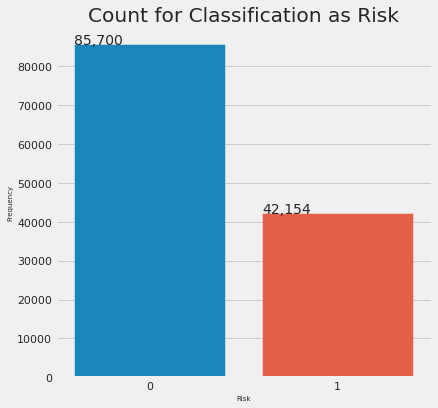

In [ ]:
# visualzing the count of 'Risk' for customers
# Risk

plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('fivethirtyeight')

ax = sb.countplot(data_scaled['Risk'])
plt.title('Count for Classification as Risk', fontweight = 3)
plt.xlabel('Risk' ,  fontsize = 7)
plt.ylabel('Frequency' ,  fontsize = 7)

for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()))
plt.show()

In [ ]:
data['Risk'] = data_scaled['Risk']

In [ ]:
data.to_csv('Data_map.csv', index = False)

In [ ]:
x = data_scaled.drop(['Risk'], axis = 1)
y = data_scaled[['Risk']].copy()
# # Splitting training and testing data

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.30)

In [ ]:
# Applying Support Vector Machine algorithm

from sklearn.svm import SVC
svclassifier = SVC(kernel='linear')
svclassifier.fit(X_train, y_train)

SVC(kernel='linear')

In [ ]:
# Predicting part, applying the model to predict

y_pred = svclassifier.predict(X_test)
# train_acc = accuracy_score(y_train, train_yhat)
# train_scores.append(train_acc)

In [ ]:
# Evaluating model performance

from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

# Since this model does not give any probability we need to do it sepeately.
#This is what doing here.

[[25695    11]
 [   19 12632]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     25706
           1       1.00      1.00      1.00     12651

    accuracy                           1.00     38357
   macro avg       1.00      1.00      1.00     38357
weighted avg       1.00      1.00      1.00     38357



Text(0.5, 12.73999999999998, 'Predicted label\n')

<Figure size 3600x3600 with 0 Axes>

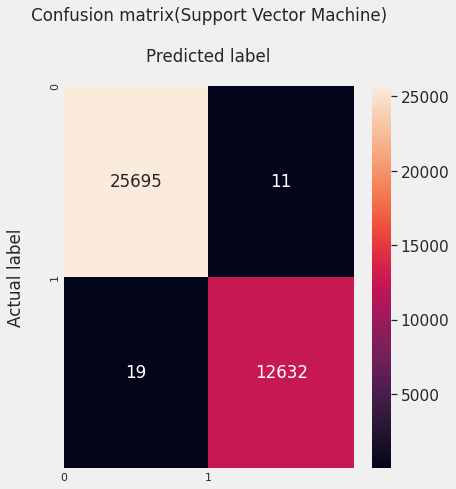

In [ ]:
cm = confusion_matrix(y_test, y_pred)
df_cm = pd.DataFrame(cm, index = (0, 1), columns = (0, 1))
plt.figure(figsize = (50,50))
fig, ax = plt.subplots()
sb.set(font_scale=1.4)
sb.heatmap(df_cm, annot=True, fmt='g'
           )
class_names=[0,1]
tick_marks = np.arange(len(class_names))
plt.tight_layout()
plt.title('Confusion matrix(Support Vector Machine)\n', y=1.1)
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
ax.xaxis.set_label_position("top")
plt.ylabel('Actual label\n')
plt.xlabel('Predicted label\n')

In [ ]:
from sklearn import metrics
print(metrics.accuracy_score(y_test,y_pred))

0.9992178741820268


In [ ]:
from sklearn.model_selection import cross_val_score  # have a good range of accuracy
scores = cross_val_score(svclassifier, x, y, cv=10, scoring='accuracy')
scores

array([0.99960895, 0.99953074, 0.99968716, 0.99906147, 0.99968713,
       0.99945248, 0.99976535, 0.9985921 , 0.99976535, 0.99945248])

In [ ]:
#Model Evaluation using train/test split
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score
from sklearn.metrics import confusion_matrix, precision_recall_curve, roc_curve, auc, log_loss
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE

X = data_scaled.drop(['Risk'], axis = 1)
y = data_scaled[['Risk']].copy()

In [ ]:
# create X (features) and y (response) with original features before feature selection
X_train2, X_test2, y_train2, y_test2 = train_test_split(X, y, test_size=0.3, random_state=2)

In [ ]:
#Using AUC-ROC
logreg = LogisticRegression()
logreg.fit(X_train2, y_train2)
y_pred2 = logreg.predict(X_test2)
y_pred_proba2 = logreg.predict_proba(X_test2)[:, 1] #proba Returns the probability of the sample for each class in the model
[fpr, tpr, thr] = roc_curve(y_test2, y_pred_proba2) #thr means the array of thresholds used to calculate TPR and FPR. (The thresholds used to classify an instance is belongs to FRP or TPR)

In [ ]:
#Finding Acuracy score with the originally input features
accuracy_score(y_test2, y_pred2)

0.999270015903225

In [ ]:
print(confusion_matrix(y_test2,y_pred2))
print(classification_report(y_test2,y_pred2))

[[25740     6]
 [   22 12589]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     25746
           1       1.00      1.00      1.00     12611

    accuracy                           1.00     38357
   macro avg       1.00      1.00      1.00     38357
weighted avg       1.00      1.00      1.00     38357



Text(0.5, 1.7399999999999807, 'Predicted label\n')

<Figure size 3600x3600 with 0 Axes>

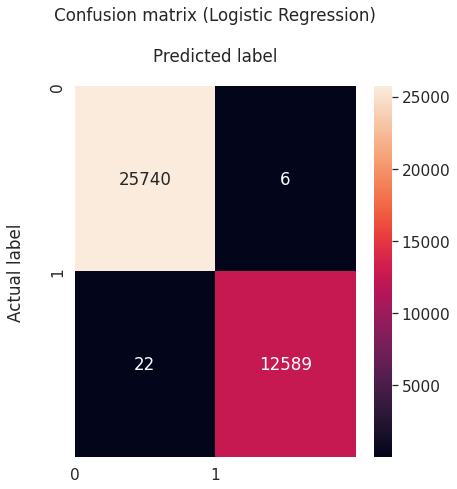

In [ ]:
cm = confusion_matrix(y_test2, y_pred2)
df_cm = pd.DataFrame(cm, index = (0, 1), columns = (0, 1))
plt.figure(figsize = (50,50))
fig, ax = plt.subplots()
sb.set(font_scale=1.4)
sb.heatmap(df_cm, annot=True, fmt='g'
           )
class_names=[0,1]
tick_marks = np.arange(len(class_names))
plt.tight_layout()
plt.title('Confusion matrix (Logistic Regression)\n', y=1.1)
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
ax.xaxis.set_label_position("top")
plt.ylabel('Actual label\n')
plt.xlabel('Predicted label\n')

In [ ]:
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

In [ ]:
X = data_scaled.drop(['Risk'], axis = 1)
y = data_scaled[['Risk']].copy()

In [ ]:
# create X (features) and y (response) with original features before feature selection
X_train3, X_test3, y_train3, y_test3 = train_test_split(X, y, test_size=0.3, random_state=2)

In [ ]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train3,y_train3)

#Predict the response for test dataset
y_pred3 = clf.predict(X_test3)

In [ ]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test3, y_pred3))

Accuracy: 0.9821414604896107


In [ ]:
print(confusion_matrix(y_test3,y_pred3))
print(classification_report(y_test3,y_pred3))

[[25391   355]
 [  330 12281]]
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     25746
           1       0.97      0.97      0.97     12611

    accuracy                           0.98     38357
   macro avg       0.98      0.98      0.98     38357
weighted avg       0.98      0.98      0.98     38357



Text(0.5, 1.7399999999999807, 'Predicted label\n')

<Figure size 3600x3600 with 0 Axes>

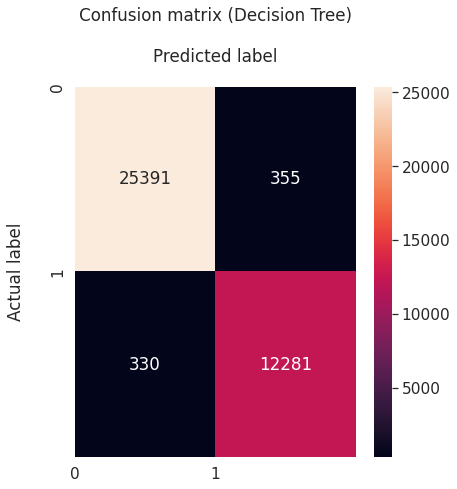

In [ ]:
cm = confusion_matrix(y_test3, y_pred3)
df_cm = pd.DataFrame(cm, index = (0, 1), columns = (0, 1))
plt.figure(figsize = (50,50))
fig, ax = plt.subplots()
sb.set(font_scale=1.4)
sb.heatmap(df_cm, annot=True, fmt='g'
           )
class_names=[0,1]
tick_marks = np.arange(len(class_names))
plt.tight_layout()
plt.title('Confusion matrix (Decision Tree)\n', y=1.1)
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
ax.xaxis.set_label_position("top")
plt.ylabel('Actual label\n')
plt.xlabel('Predicted label\n')

In [ ]:
!pip install graphviz
!pip install pydotplus

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install sklearn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for sklearn
  Running setup.py clean for sklearn
Failed to build sklearn
  Running setup.py install for sklearn ... done
  DEPRECATION: sklearn was installed using the legacy 'setup.py install' method, because a wheel could not be built for it. A possible replacement is to fix the wheel build issue reported above. Discussion can be found at https://github.com/pypa/pip/issues/8368


In [ ]:
from sklearn.tree import export_graphviz
# from sklearn.externals.six import StringIO
from six import StringIO
from IPython.display import Image
import pydotplus

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True,feature_names = X.columns,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('diabetes.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.463682 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.463682 to fit



In [ ]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 575.9/575.9 KB 10.8 MB/s eta 0:00:00


In [ ]:
import shap

In [ ]:
Model01 = svclassifier

In [ ]:
background = shap.maskers.Independent(X_train, max_samples=1000)
explainer01 = shap.Explainer(Model01, background)
shap_values_m1 = explainer01(X_train)

SHAP BAR PLOT


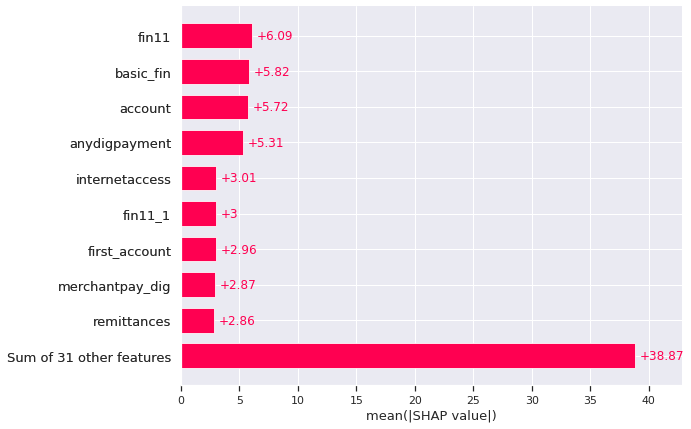

-------------------------------------------------------------------------------------------------------------
SHAP SUMMARY PLOT


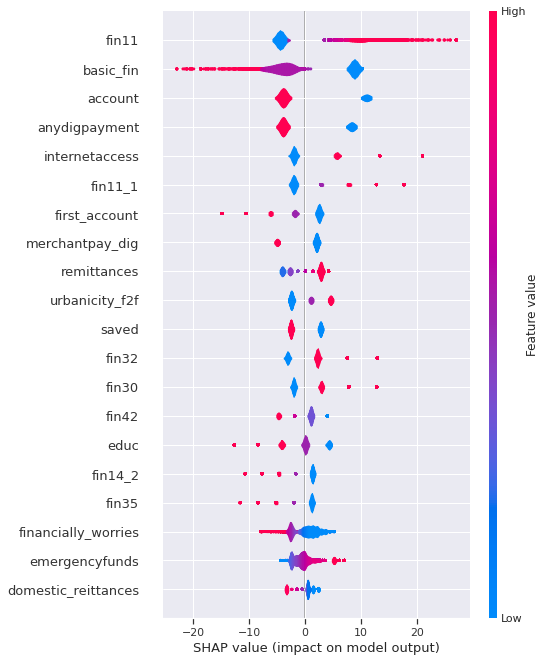

-------------------------------------------------------------------------------------------------------------
SHAP WATERFALL PLOT


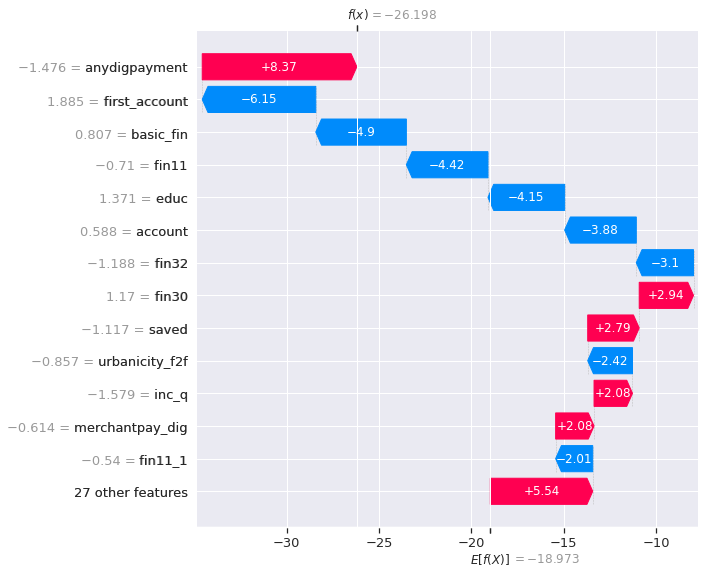

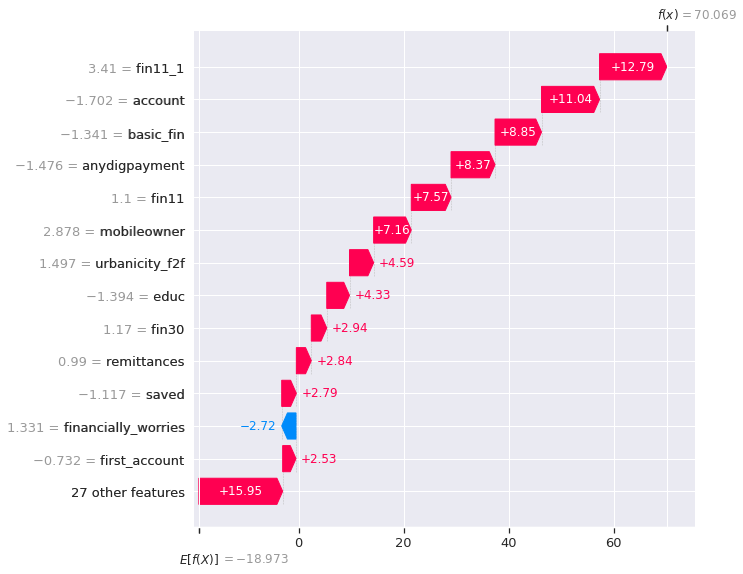

-------------------------------------------------------------------------------------------------------------
SHAP HEATMAP


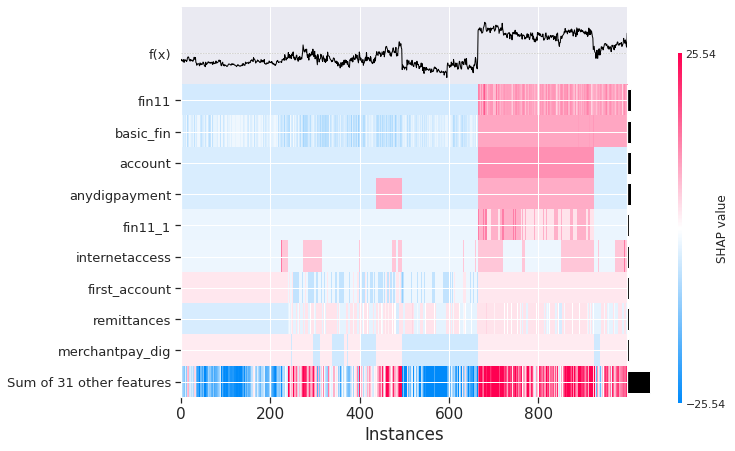

In [ ]:
print('SHAP BAR PLOT')
shap.plots.bar(shap_values_m1)
print('-------------------------------------------------------------------------------------------------------------')

print('SHAP SUMMARY PLOT')
shap.summary_plot(shap_values_m1, plot_type='violin')
print('-------------------------------------------------------------------------------------------------------------')

print('SHAP WATERFALL PLOT')
shap.plots.waterfall(shap_values_m1[0], max_display=14)
shap.plots.waterfall(shap_values_m1[17], max_display=14)
print('-------------------------------------------------------------------------------------------------------------')

print('SHAP HEATMAP')
shap.plots.heatmap(shap_values_m1[:1000])

In [ ]:
Model02 = logreg

In [ ]:
background = shap.maskers.Independent(X_train2, max_samples=1000)
explainer02 = shap.Explainer(Model02, background)
shap_values_m2 = explainer02(X_train2)

SHAP BAR PLOT


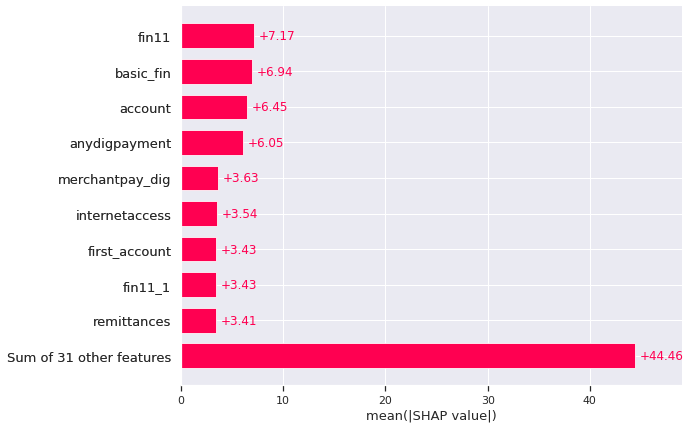

-------------------------------------------------------------------------------------------------------------
SHAP SUMMARY PLOT


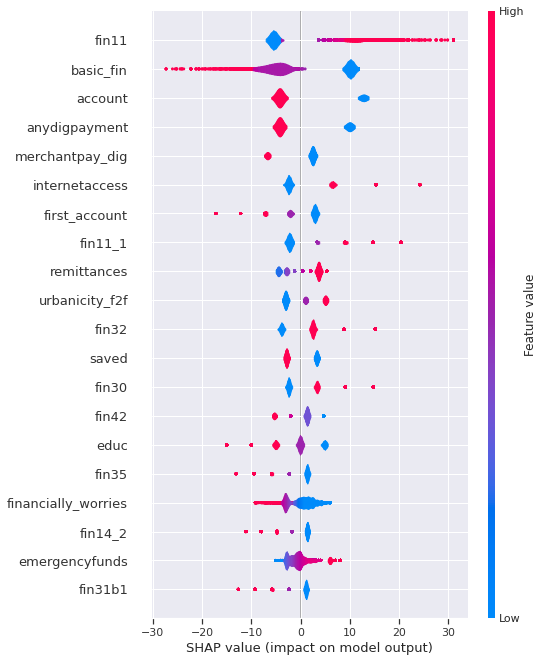

-------------------------------------------------------------------------------------------------------------
SHAP WATERFALL PLOT


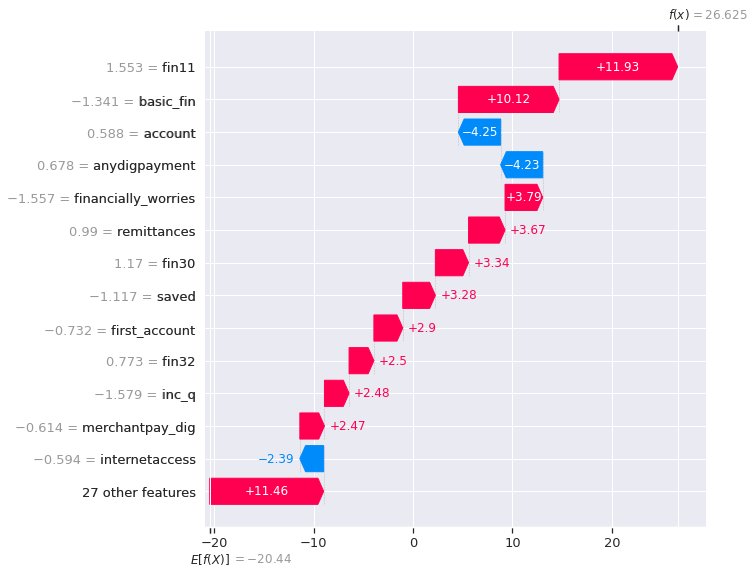

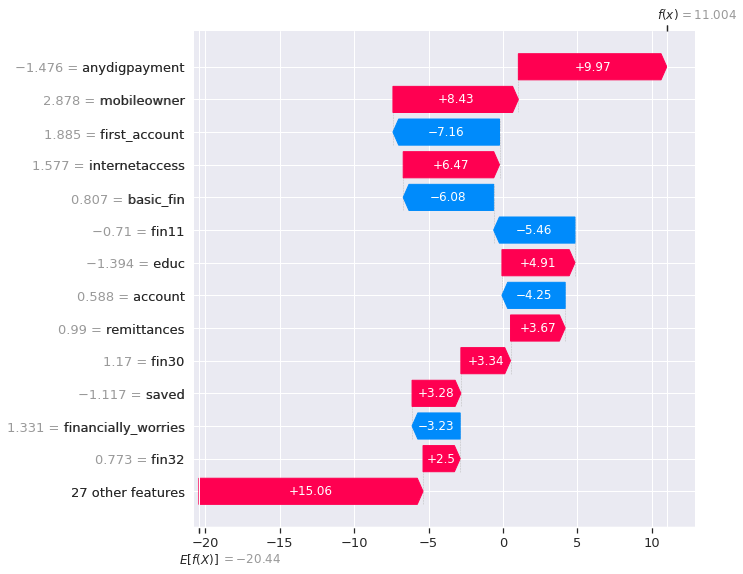

-------------------------------------------------------------------------------------------------------------
SHAP HEATMAP


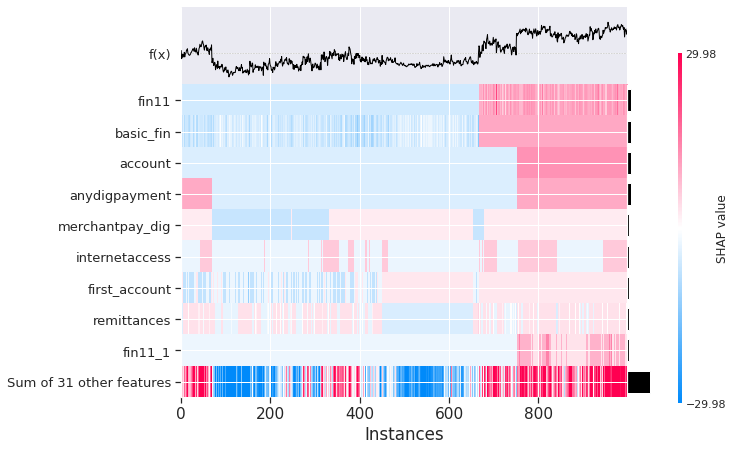

In [ ]:
print('SHAP BAR PLOT')
shap.plots.bar(shap_values_m2)
print('-------------------------------------------------------------------------------------------------------------')

print('SHAP SUMMARY PLOT')
shap.summary_plot(shap_values_m2, plot_type='violin')
print('-------------------------------------------------------------------------------------------------------------')

print('SHAP WATERFALL PLOT')
shap.plots.waterfall(shap_values_m2[0], max_display=14)
shap.plots.waterfall(shap_values_m2[17], max_display=14)
print('-------------------------------------------------------------------------------------------------------------')

print('SHAP HEATMAP')
shap.plots.heatmap(shap_values_m2[:1000])

In [ ]:
explainer = shap.TreeExplainer(clf)
expected_value = explainer.expected_value
if isinstance(expected_value, list):
    expected_value = expected_value[1]
print(f"Explainer expected value: {expected_value}")

select = range(20)
features = X_test3.iloc[select]
features_display = X.loc[features.index]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    shap_values = explainer.shap_values(features)[1]
    shap_interaction_values = explainer.shap_interaction_values(features)
if isinstance(shap_interaction_values, list):
    shap_interaction_values = shap_interaction_values[1]

Explainer expected value: [0.66989955 0.33010045]


In [ ]:
explainer = shap.TreeExplainer(clf)
shap_values = explainer.shap_values(X_test3)

In [ ]:
base = explainer.expected_value
base
shap_values[0][0]

array([-2.42791581e-04, -8.52602405e-04, -3.01412617e-06,  3.55881523e-05,
        2.76428524e-04,  1.96587126e-05, -6.81049102e-04, -3.43719638e-04,
        2.27220835e-03,  2.19541508e-03,  1.01235061e-04,  7.87210850e-04,
        9.34324977e-03,  0.00000000e+00,  0.00000000e+00,  2.74226949e-04,
        1.02672377e-02,  3.05557497e-03, -4.25434057e-03, -8.89435905e-04,
        1.08355276e-02,  5.53116407e-03, -1.89421544e-04,  4.33902773e-05,
        8.41028838e-04,  9.30074439e-04, -3.81694373e-03,  7.18362642e-04,
       -1.72466769e-03,  2.22040469e-03,  1.55866179e-02,  9.12148501e-02,
        2.07973666e-02,  1.61976279e-01,  1.26237083e-03, -2.16212197e-04,
       -1.22379581e-03,  1.57914761e-03, -1.05988809e-03,  3.43371389e-03])

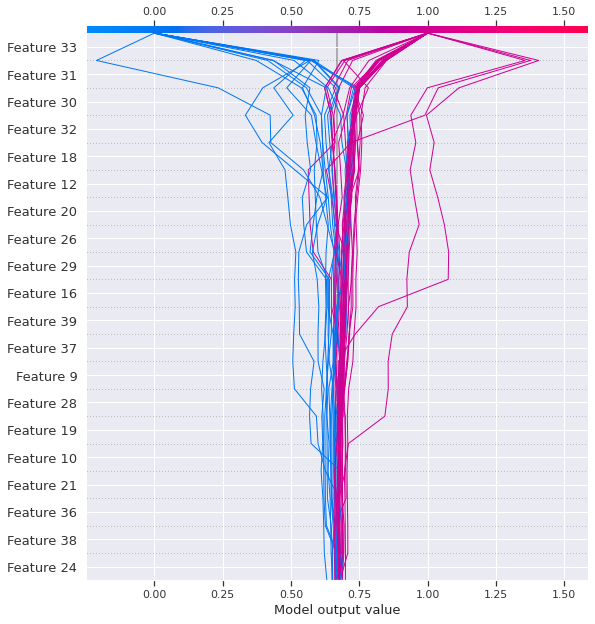

In [ ]:
shap.decision_plot(base_value = base[0], shap_values = shap_values[0][55:100])

In [ ]:
explainer = shap.TreeExplainer(model = clf, data = None, model_output = 'raw', feature_perturbation = 'tree_path_dependent')

In [ ]:
shap_values = explainer.shap_values(X_train3)
np.array(shap_values).shape

(2, 89497, 40)

In [ ]:
x = np.array(X_train3)
x[0,:]

array([ 1.04478626, -0.95864977,  1.01219759,  1.01898284,  0.98754761,
        1.02724543, -0.99559841,  1.05942207, -1.30434079, -0.01128856,
       -1.57915406,  1.3559398 ,  0.31998567,  0.58758063, -0.53997934,
       -0.54858493, -0.44264025, -0.43939743,  1.16993067, -0.47424247,
        0.77344168, -0.47580957,  0.46699435,  0.35205576, -0.39743789,
       -0.28629531, -1.11654774, -1.05794336,  0.98968068, -0.33081288,
       -0.5937868 ,  0.6775108 , -0.61428916,  1.55344937,  3.30282825,
       -0.2540056 , -0.73212438, -1.55670761, -1.34058391, -0.07105967])

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[1][17,:], x[17,:], feature_names = X_train3.columns, text_rotation = 90, figsize = (60, 10))